# Mainly In this notebook, all types of EDA (Exploratory Data Analysis) That I perfoprmed for the data visualization process in  order to see the data in pictopral representation

# Step 1 : Loading and preprocessing (fixing the errors) the dataset

In [39]:
#loading the dataset into environment
import pandas as pd

file_path = "C:\\Users\\Acer\\Downloads\\fahim_vai - Sheet1 (10).csv"

try:
  df = pd.read_csv(file_path)
  df.head()
except FileNotFoundError:
  print(f"File not found at: {file_path}")


df.shape

(7329, 6)

In [40]:



#converting all dates to MM/DD/YYYY format
# Function to add leading zeros to dates
def format_date(date_str):
    # Split the date string by '/'
    parts = date_str.split('/')

    # Ensure month and day are 2 digits
    month = parts[0].zfill(2)  # Adds leading zero if month is 1 digit
    day = parts[1].zfill(2)    # Adds leading zero if day is 1 digit
    year = parts[2]            # Year remains unchanged

    # Return the date in MM/DD/YYYY format
    return f"{month}/{day}/{year}"

# Apply the formatting function to the entire 'Date' column
def fix_date_column(df):
    df['Date'] = df['Date'].apply(format_date)
    return df


df = fix_date_column(df)


def check_date_format(df):
    # Define the regex pattern for MM/DD/YYYY
    pattern = r'^\d{2}/\d{2}/\d{4}$'

    # Check which rows match the format
    correct_format = df['Date'].str.match(pattern)

    # Display the rows that do not match the pattern
    if correct_format.all():
        print("All dates are in MM/DD/YYYY format")
    else:
        print("The following dates are not in the correct format:")
        print(df[~correct_format]['Date'])


check_date_format(df)



import pandas as pd

# Dictionary of correct city names mapping to incorrect ones
city_corrections = {
    'Narsingdi': ['Norshindi', 'Narshindi', 'Narsindi'],
    'Chittagong': ['Chittgong', 'Chattogram'],
    'Narayanganj': ['Narayangonj'],
    'Barishal': ['Barisal']
}

# Replace the incorrect city names with the correct ones
for correct_city, wrong_cities in city_corrections.items():
    df['City'] = df['City'].replace(wrong_cities, correct_city)

# Print the unique cities after corrections
unique_cities_after_correction = df['City'].unique()
print("Unique cities after correction:")
for city in unique_cities_after_correction:
    print(city)
#the above code is to fix all the correct city names



df.head()

All dates are in MM/DD/YYYY format
Unique cities after correction:
Dhaka
Chittagong
Gazipur
Narayanganj
Sylhet
Khulna
Rajshahi
Barishal
Savar
Mymensingh
Rangpur
Cumilla
Narsingdi


,Date,City,AQI,Responsible Pollutant,AQI Category,Comments
0,11/18/2024,Dhaka,200,PM2.5,UNHEALTHY,AQI Range: 186-223
1,11/18/2024,Chittagong,DNA,DNA,DNA,DNA
2,11/18/2024,Gazipur,251,PM2.5,VERY UNHEALTHY,NaN
3,11/18/2024,Narayanganj,267,PM2.5,VERY UNHEALTHY,NaN
4,11/18/2024,Sylhet,100,PM2.5,MODERATE,NaN


In [41]:
# Ensure the 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')

# Sort the data by Date for correct plotting
df = df.sort_values(by='Date')

# Filter out rows where AQI is not available (if needed)
df = df[df['AQI'] != 'DNA']
df['AQI'] = pd.to_numeric(df['AQI'], errors='coerce')


df.shape

(6537, 6)

# Step 2: Data Visualization

AQI Trends Over Time for Each City

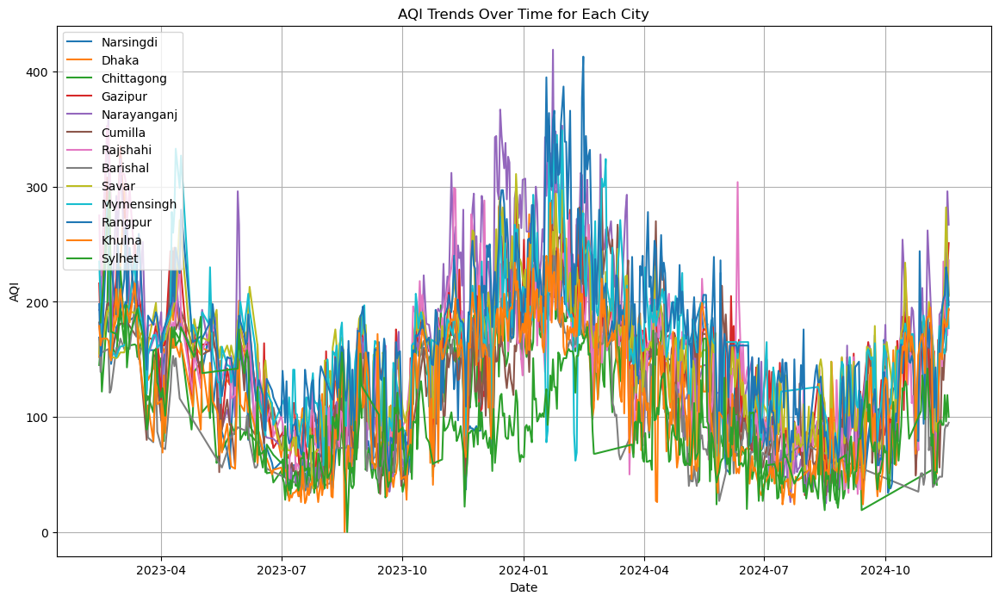

In [42]:
import matplotlib.pyplot as plt
# Plot AQI trends for each city
plt.figure(figsize=(14, 8)) #14 8
cities = df['City'].unique()

for city in cities:
    city_data = df[df['City'] == city]
    plt.plot(city_data['Date'], city_data['AQI'], label=city)

plt.title('AQI Trends Over Time for Each City')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


AQI Trend Over Time for each city 

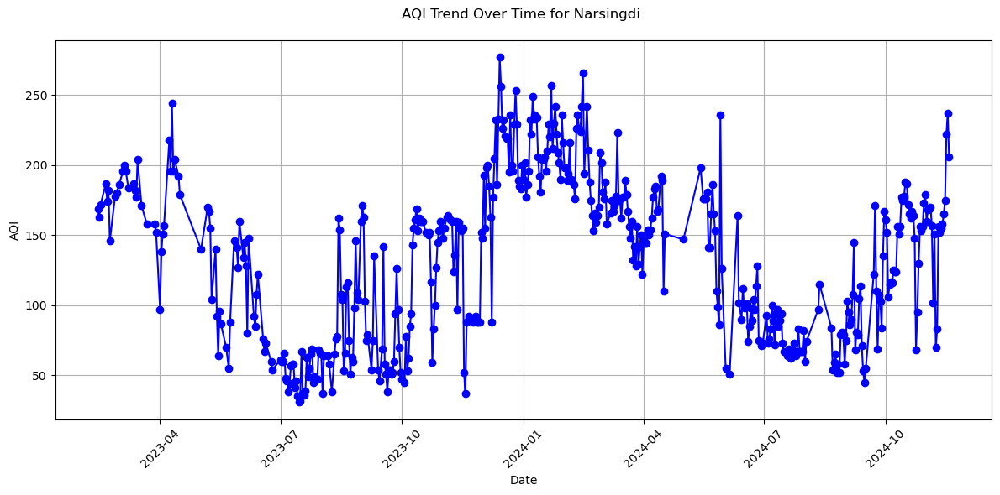

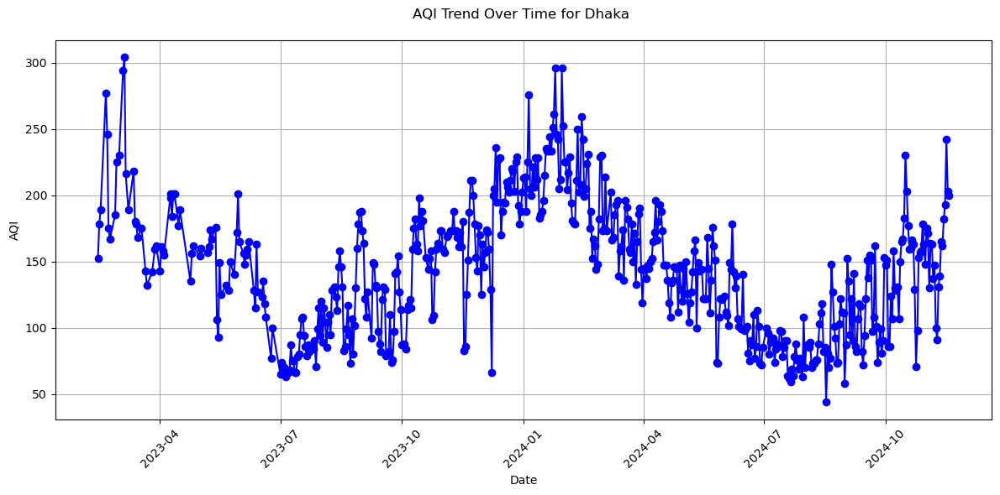

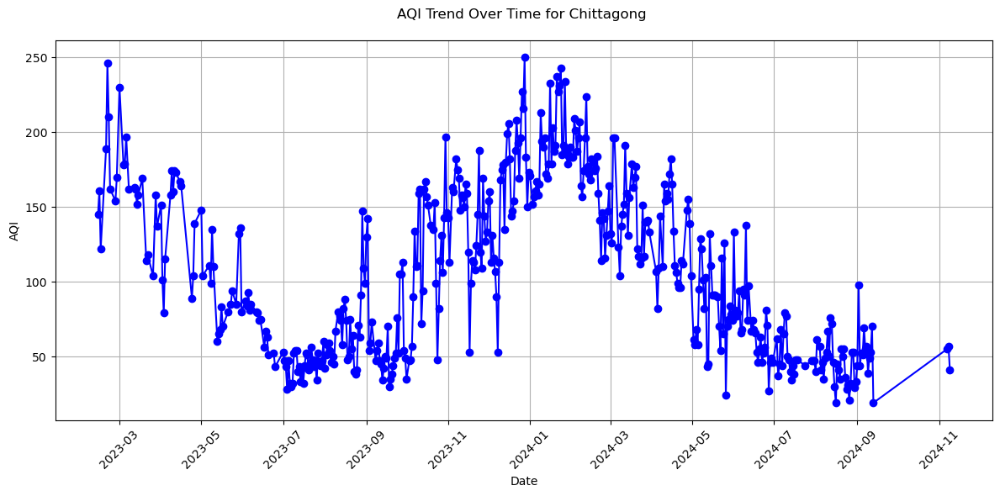

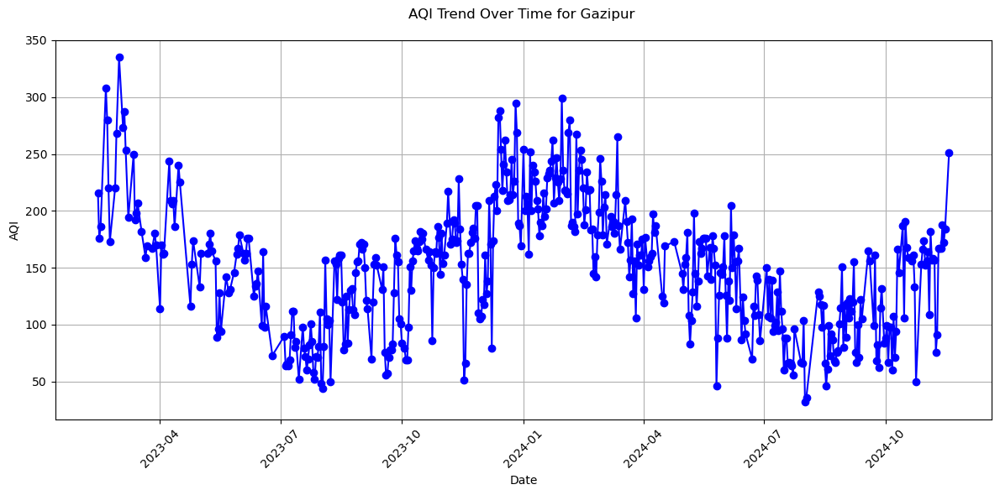

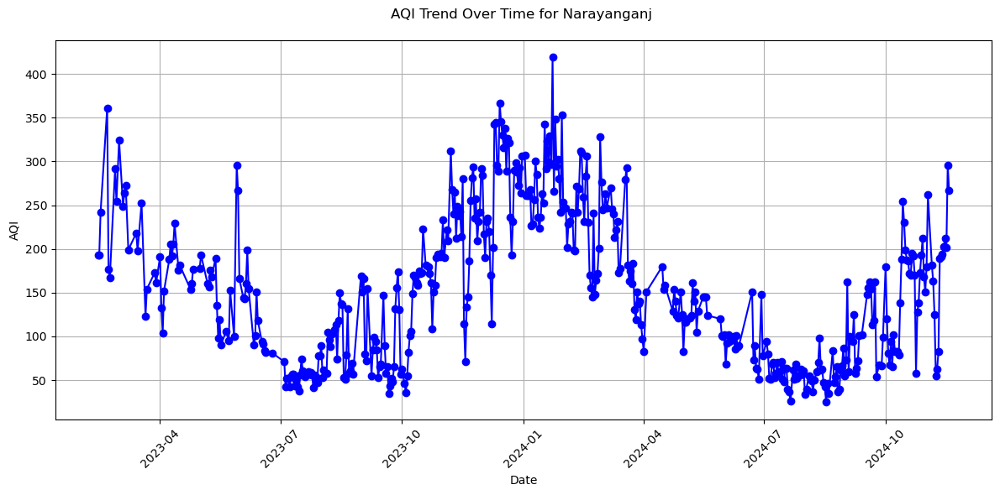

...

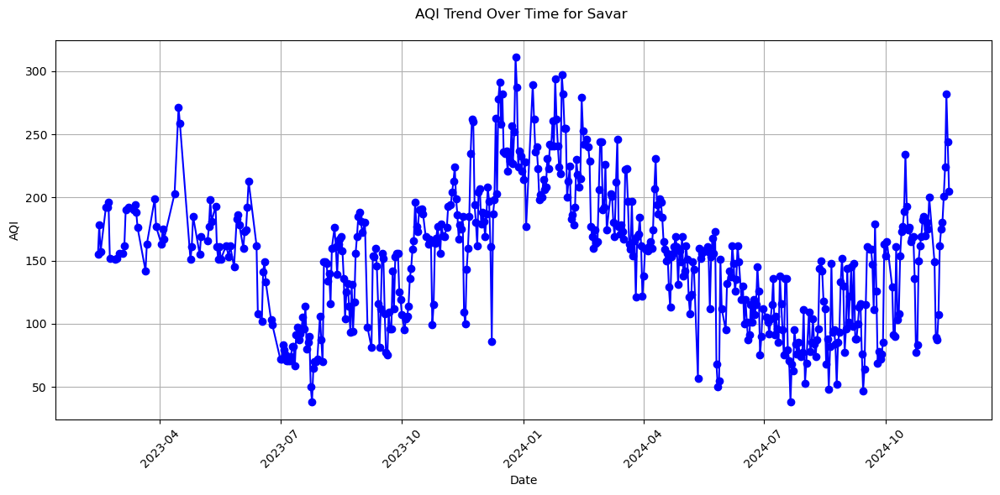

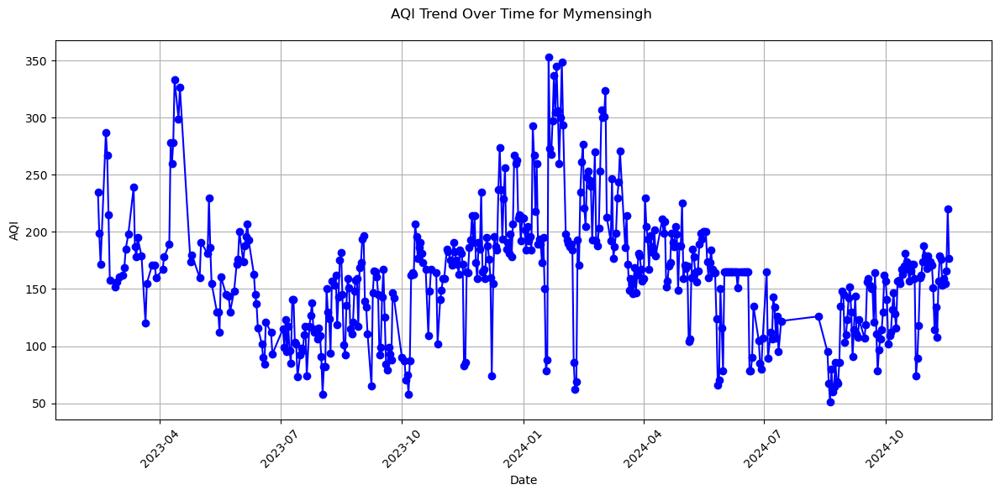

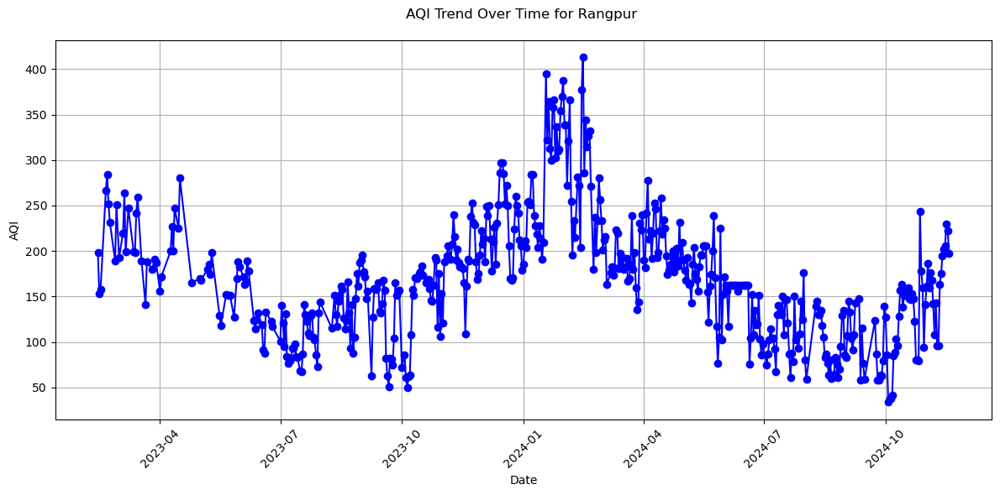

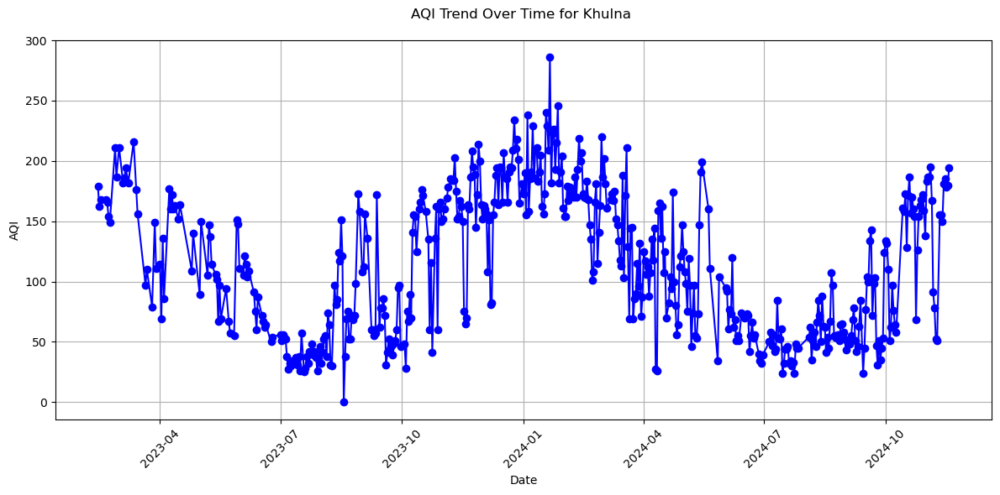

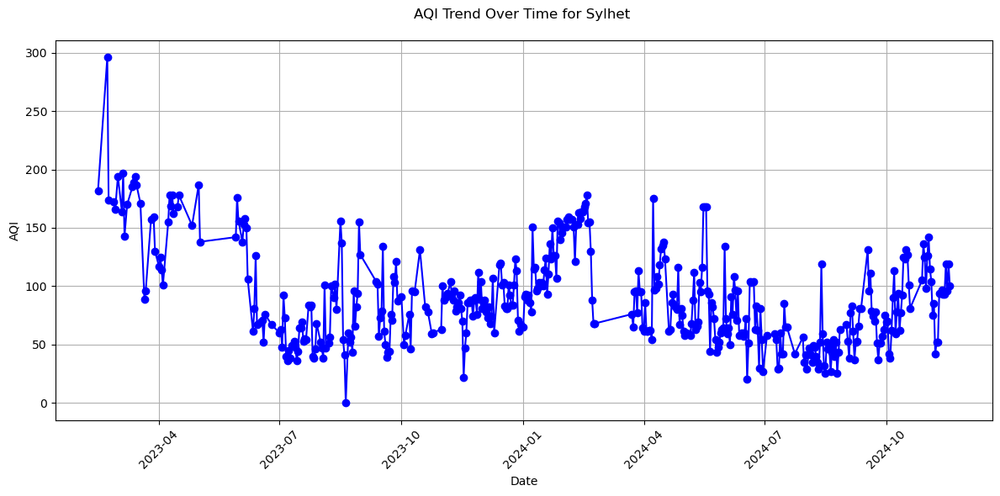

In [43]:
# Loop through each city and create individual plots for AQI trends
cities = df['City'].unique()

for city in cities:
    plt.figure(figsize=(12, 6))
    city_data = df[df['City'] == city]

    plt.plot(city_data['Date'], city_data['AQI'], label=city, color='b', marker='o')
    plt.title(f'AQI Trend Over Time for {city} \n')
    plt.xlabel('Date')
    plt.ylabel('AQI')
    plt.grid(True)

    #Rotate the x-axis labels for better readability
    plt.xticks(rotation=45)

    plt.tight_layout()
    plt.show()


Average AQI and AQI distribution over city. 

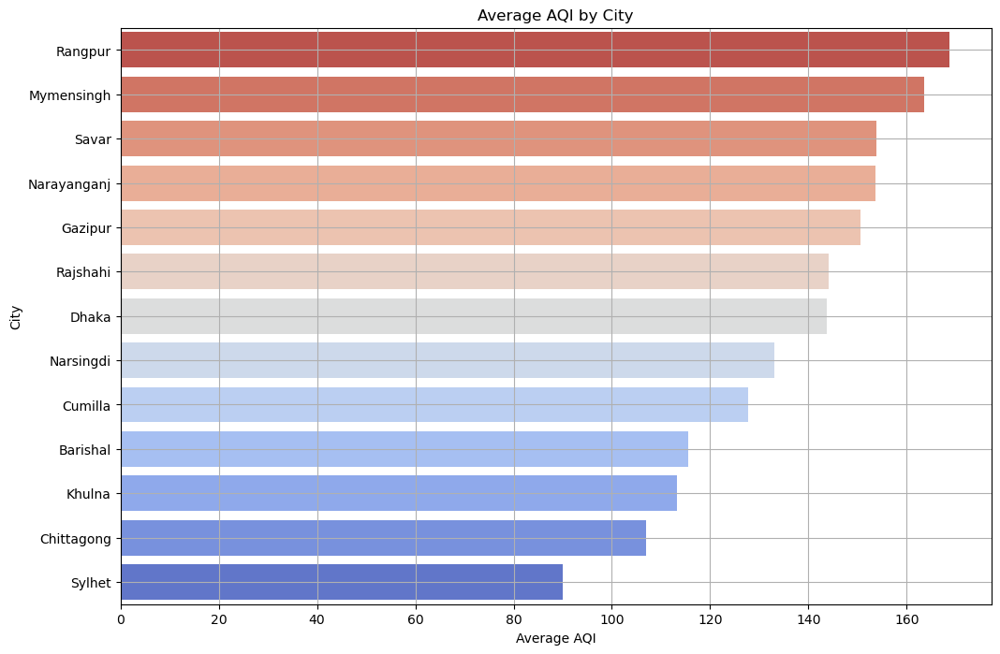

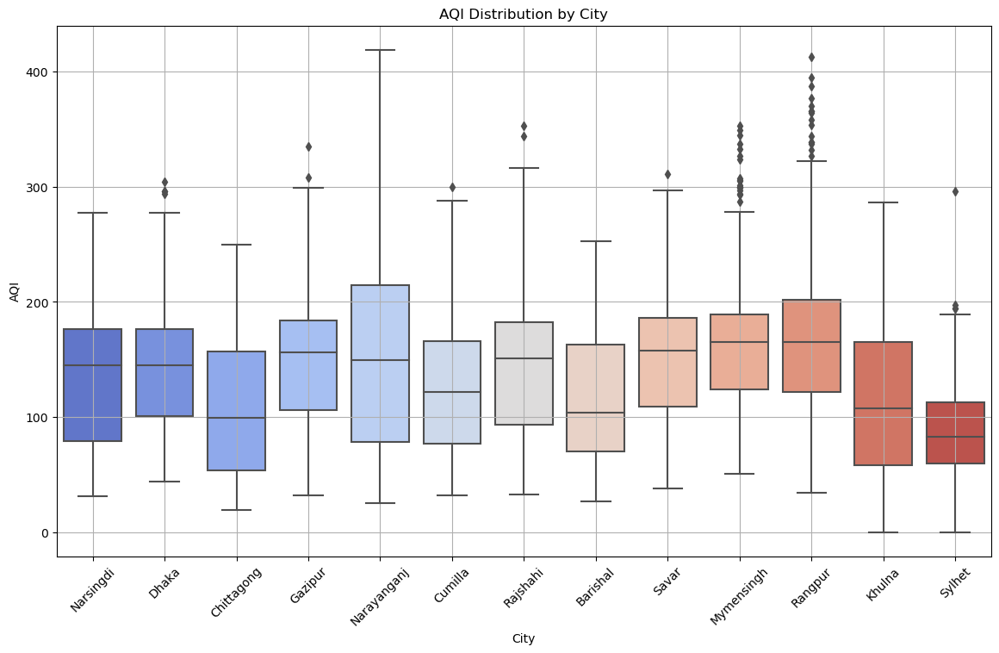

In [44]:
import seaborn as sns

# Group by City to calculate average AQI per city
city_aqi_avg = df.groupby('City')['AQI'].mean().sort_values(ascending=False)

# Plotting the average AQI for each city
plt.figure(figsize=(12, 8))
sns.barplot(x=city_aqi_avg.values, y=city_aqi_avg.index, palette='coolwarm_r')
plt.title('Average AQI by City')
plt.xlabel('Average AQI')
plt.ylabel('City')
plt.grid(True)
plt.show()


# Bar Plot (Average AQI by City):
# This plot shows the average AQI for each city.
# The cities at the top of the bar chart have higher average AQI, meaning their air quality is generally worse.
# The cities at the bottom have a lower average AQI, indicating better air quality.
# What you can learn:

# Which cities have the worst air pollution.
# Which cities have relatively better air quality.
# This gives a quick overview of air pollution trends across all cities.


# Boxplot for AQI distribution by city
plt.figure(figsize=(14, 8))
sns.boxplot(x='City', y='AQI', data=df, palette='coolwarm')
plt.xticks(rotation=45)
plt.title('AQI Distribution by City')
plt.grid(True)
plt.show()

# Box Plot (AQI Distribution by City):
# This plot shows the distribution of AQI values for each city.
# The box represents the middle 50% of the AQI values, while the lines (called "whiskers") show the range of AQI values.
# Outliers (extreme AQI values) might appear as dots outside the whiskers.
# What you can learn:

# How spread out the AQI values are for each city. A tall box or long whiskers mean AQI values fluctuate a lot.
# If a city has many outliers, it suggests that sometimes the air quality gets much worse than usual.
# You can also compare how AQI varies between cities. Cities with narrower boxes have more consistent air quality, while wider boxes indicate more variability.


Average AQI and AQI distribution over Month. 

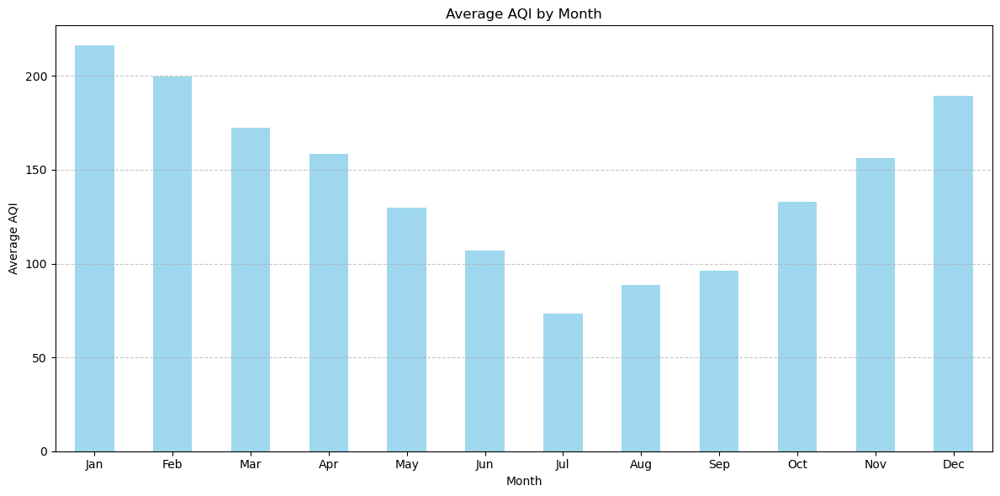

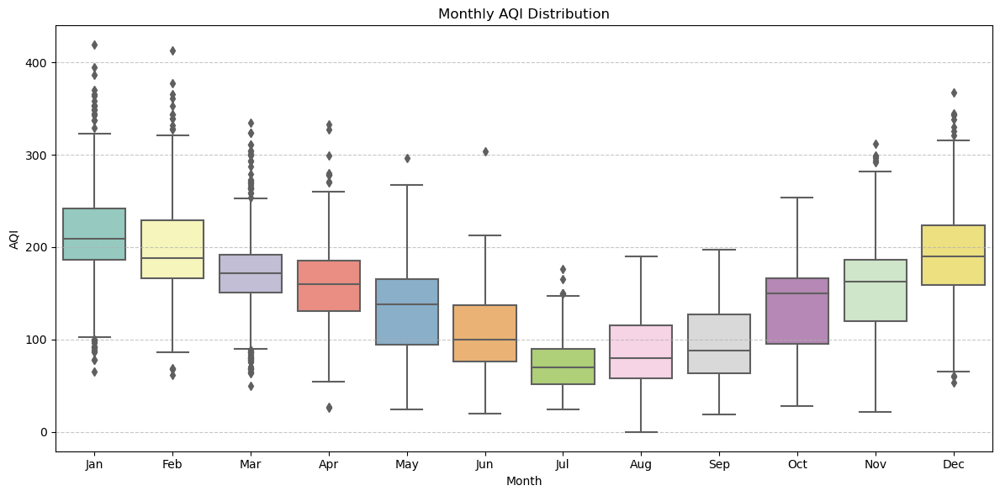

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment and provide the correct file path
# Ensure 'Date' is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract the month from the Date column
df['Month'] = df['Date'].dt.month

# Calculate monthly average AQI
monthly_avg_aqi = df.groupby('Month')['AQI'].mean()

# Plot the bar graph for monthly average AQI
plt.figure(figsize=(12, 6))
monthly_avg_aqi.plot(kind='bar', color='skyblue', alpha=0.8)
plt.title('Average AQI by Month')
plt.xlabel('Month')
plt.ylabel('Average AQI')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Create a box plot for monthly AQI distribution
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='Month', y='AQI', palette='Set3')
plt.title('Monthly AQI Distribution')
plt.xlabel('Month')
plt.ylabel('AQI')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Monthly AQI distribution City wise individuaqlly. 

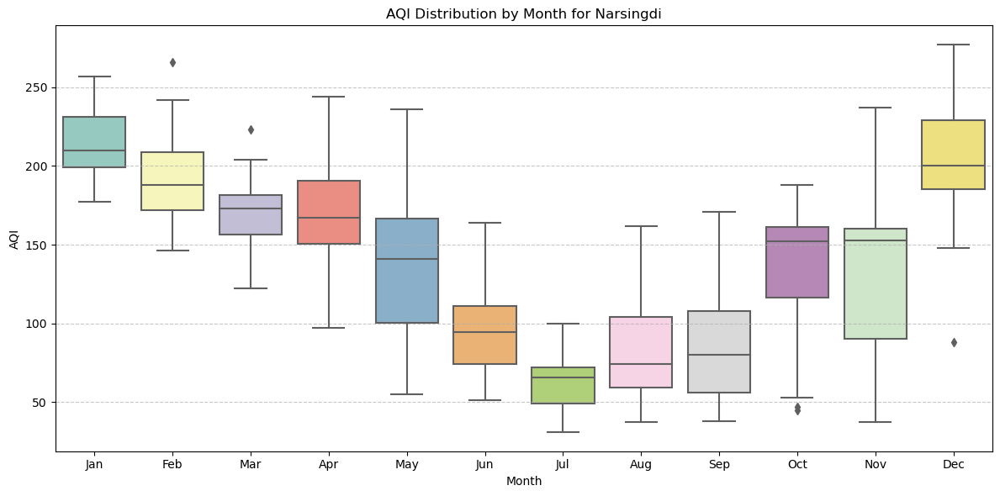

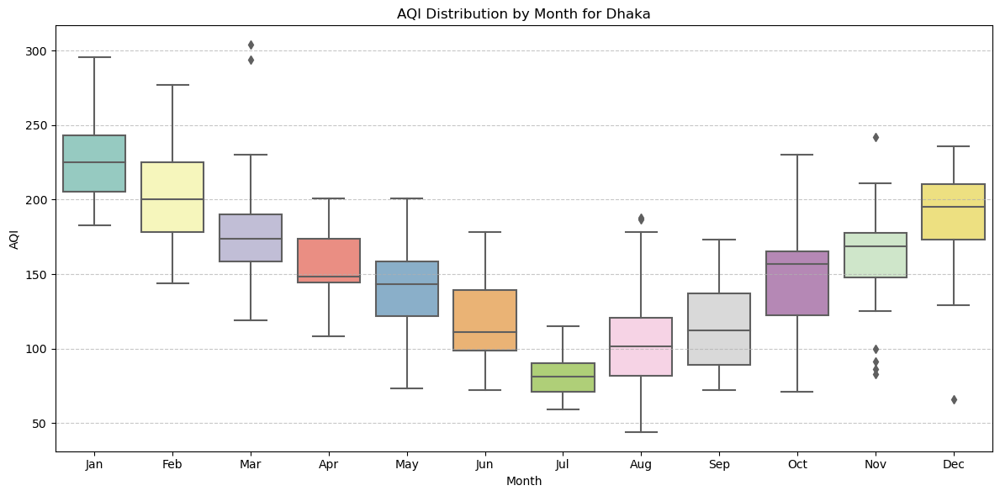

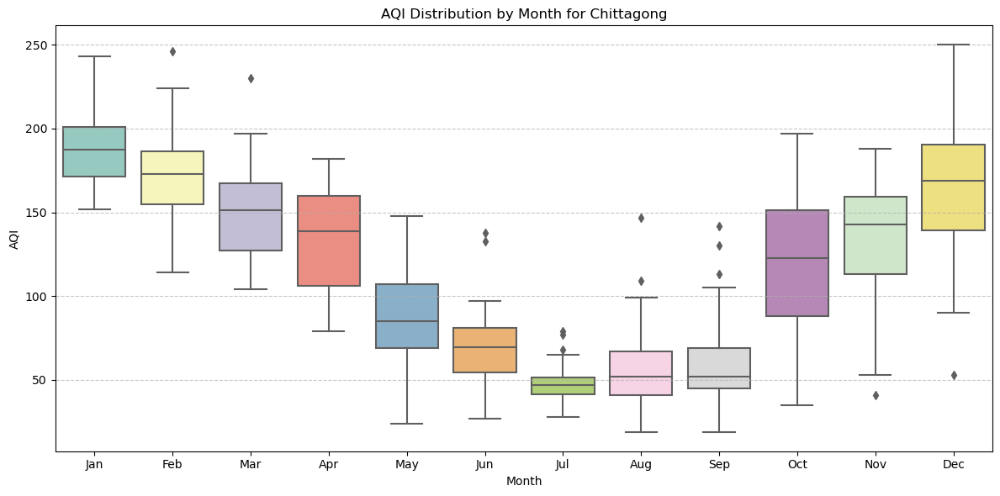

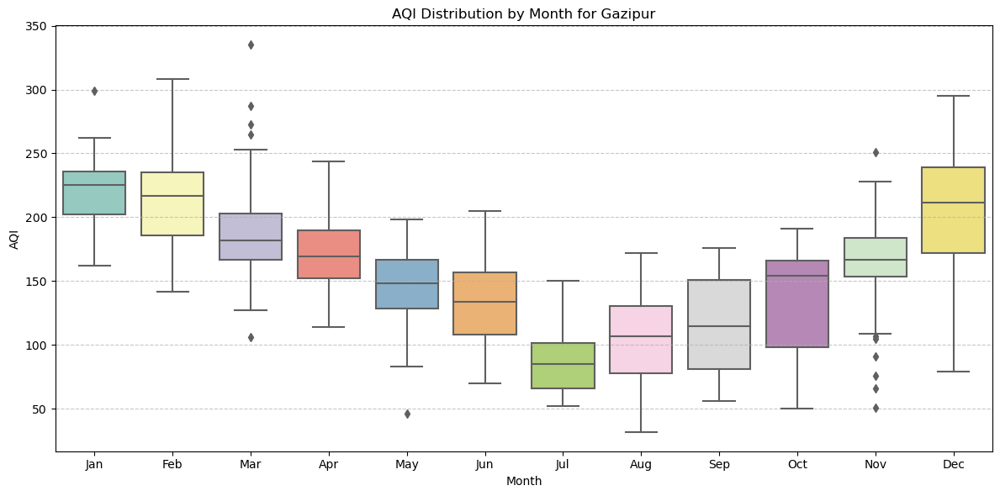

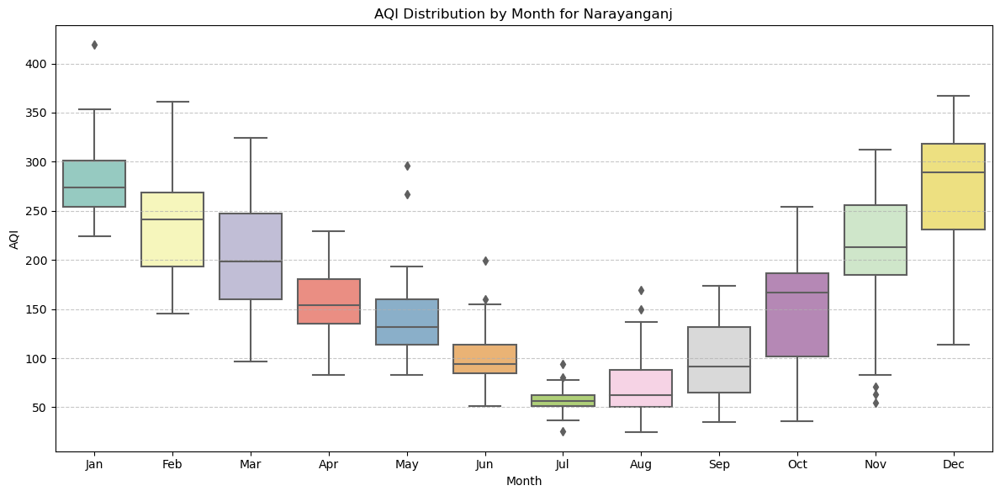

...

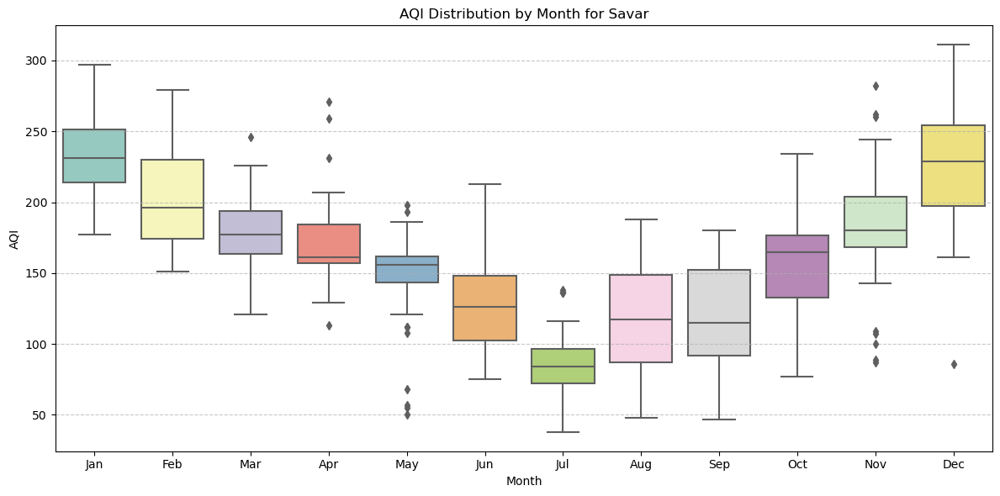

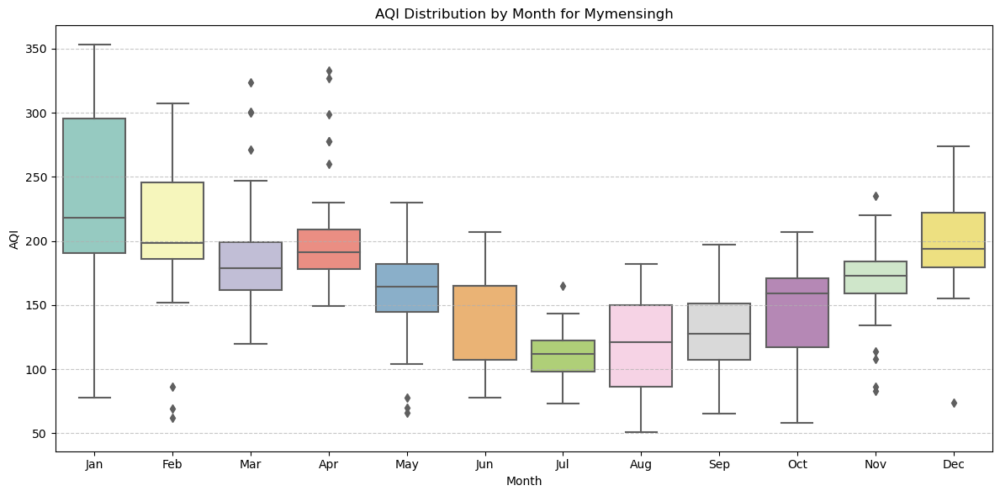

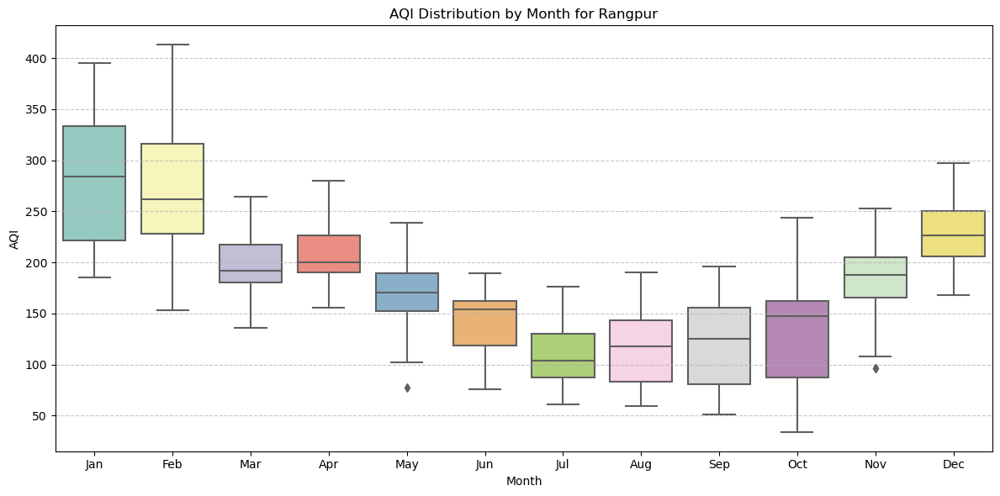

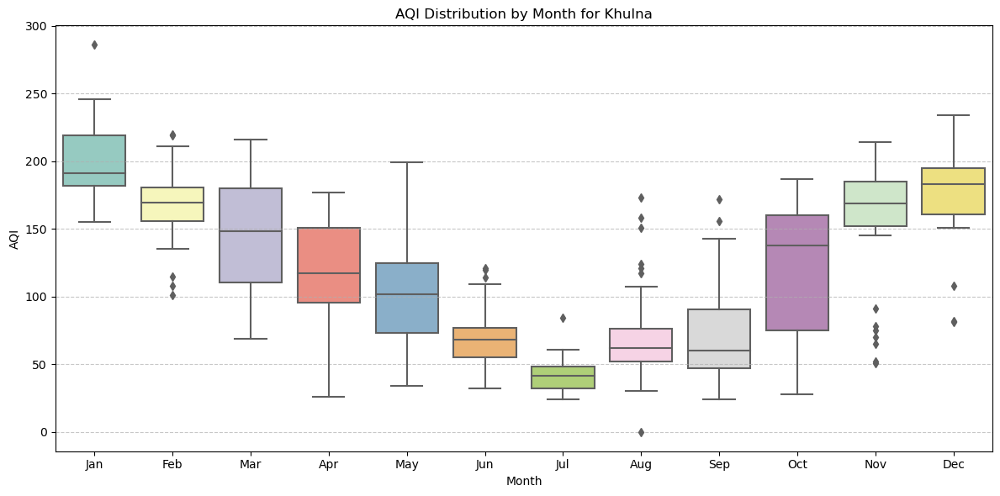

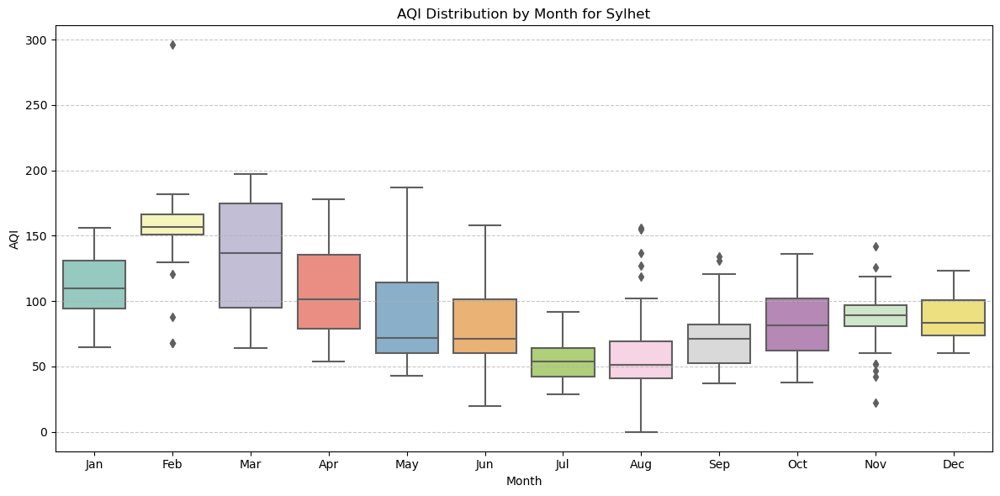

In [46]:
#Seasonal Analysis: Use seasonal decomposition (e.g., STL Decomposition) to break down AQI time series into trend, seasonality, and residual components. This can provide deeper insights into periodic AQI variations
#I did monthly analysis rather than seasonal

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment and provide the correct file path
# Ensure 'Date' is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract month and city data
df['Month'] = df['Date'].dt.month

# Get the list of unique cities
cities = df['City'].unique()

# Generate boxplots for each city
for city in cities:
    city_data = df[df['City'] == city]
    
    # Create the boxplot
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=city_data, x='Month', y='AQI', palette='Set3')
    plt.title(f'AQI Distribution by Month for {city}')
    plt.xlabel('Month')
    plt.ylabel('AQI')
    plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


Year Round Distribution over city, all country

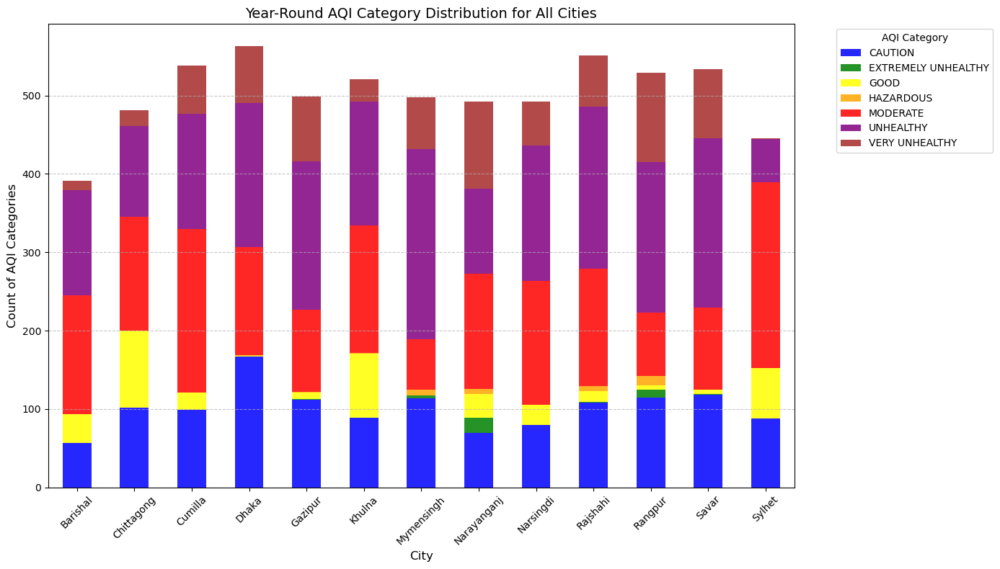

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter out the DNA category
filtered_df = df[df['AQI Category'] != 'DNA']

# Aggregate category counts by city and AQI category
city_category_counts = filtered_df.groupby(['City', 'AQI Category']).size().unstack(fill_value=0)

# Plot the stacked bar chart
city_category_counts.plot(kind='bar', stacked=True, figsize=(14, 8),
                          color=['blue', 'green', 'yellow', 'orange', 'red', 'purple', 'brown'], alpha=0.85)
plt.title('Year-Round AQI Category Distribution for All Cities', fontsize=14)
plt.xlabel('City', fontsize=12)
plt.ylabel('Count of AQI Categories', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.legend(title='AQI Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Monthly AQI Category Distribution for each city

C:\Users\Acer\AppData\Local\Temp\ipykernel_15148\1610020954.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Month'] = filtered_df['Date'].dt.month


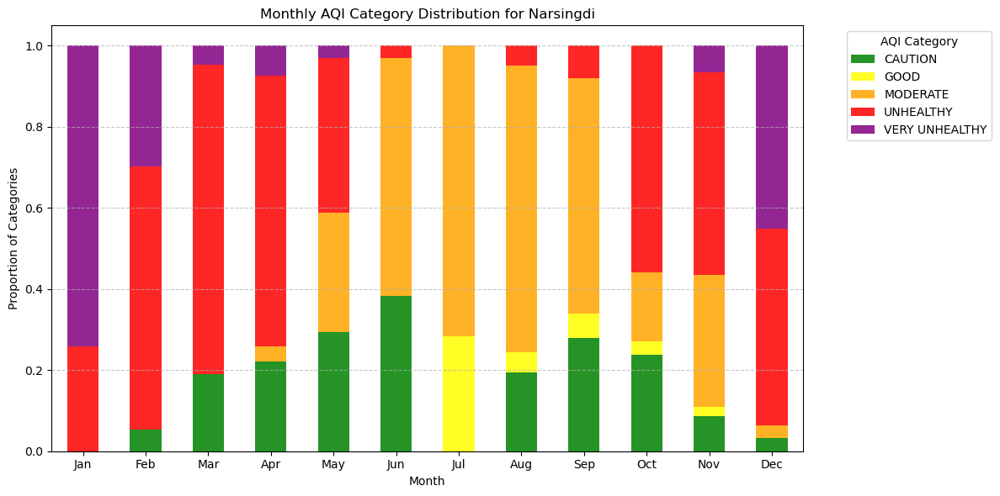

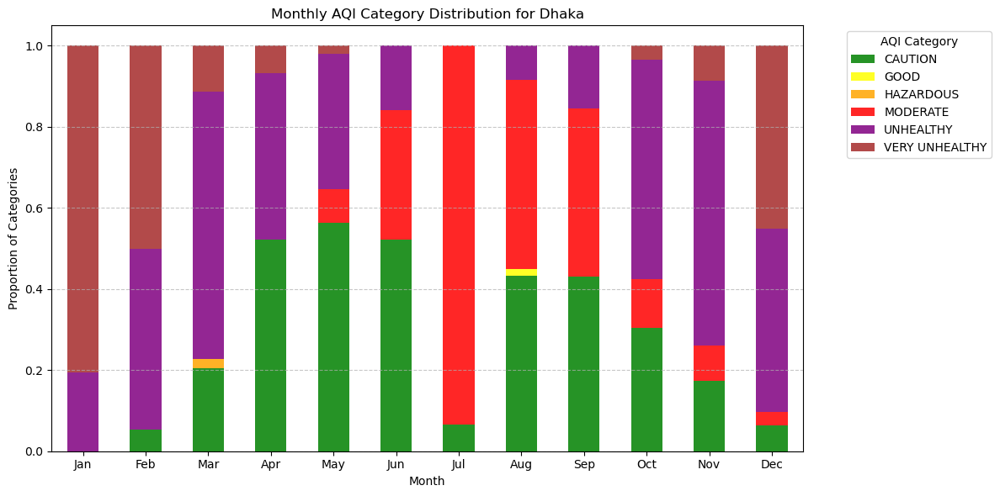

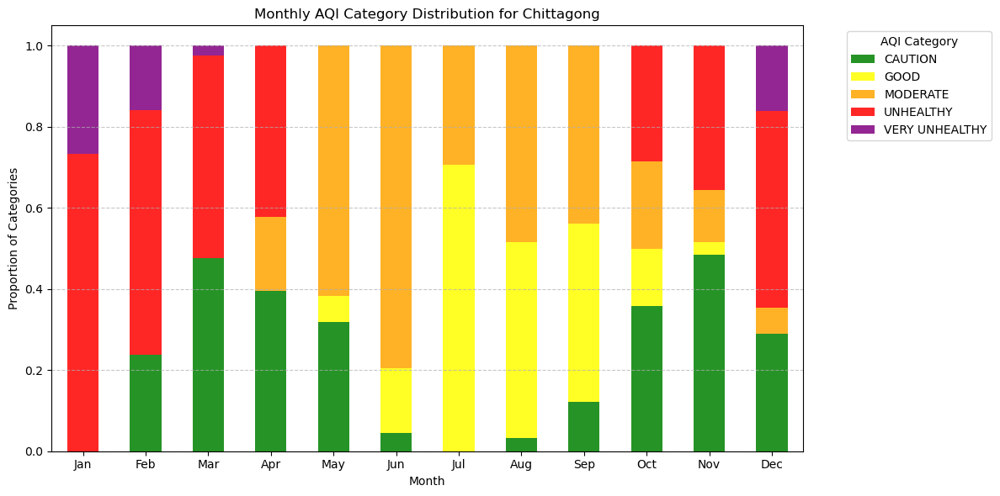

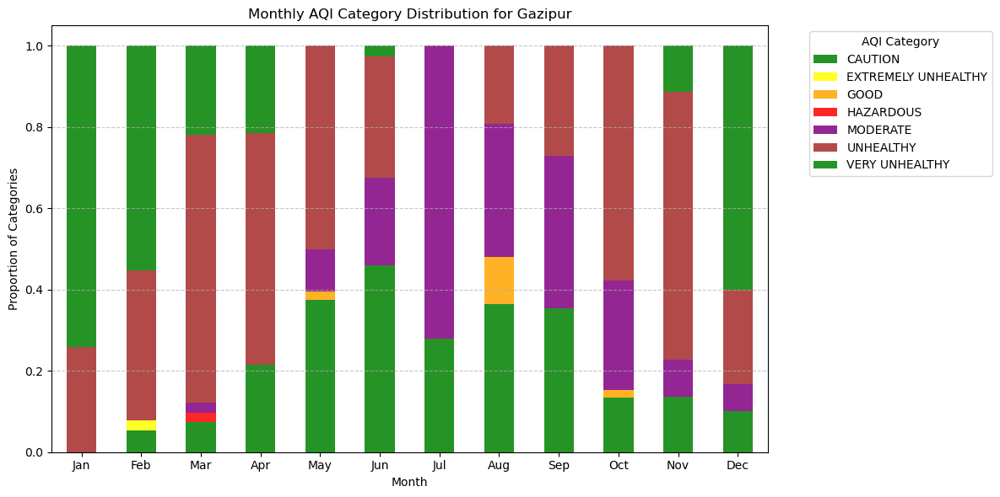

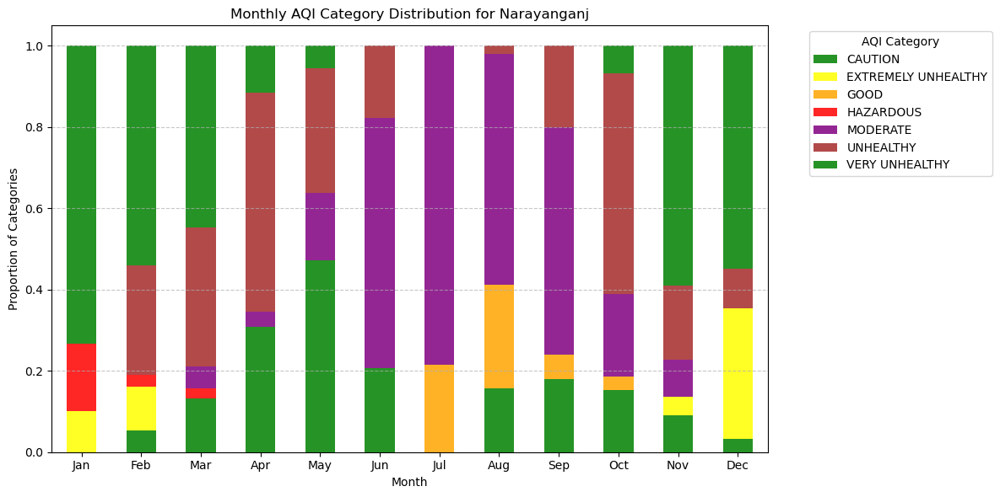

...

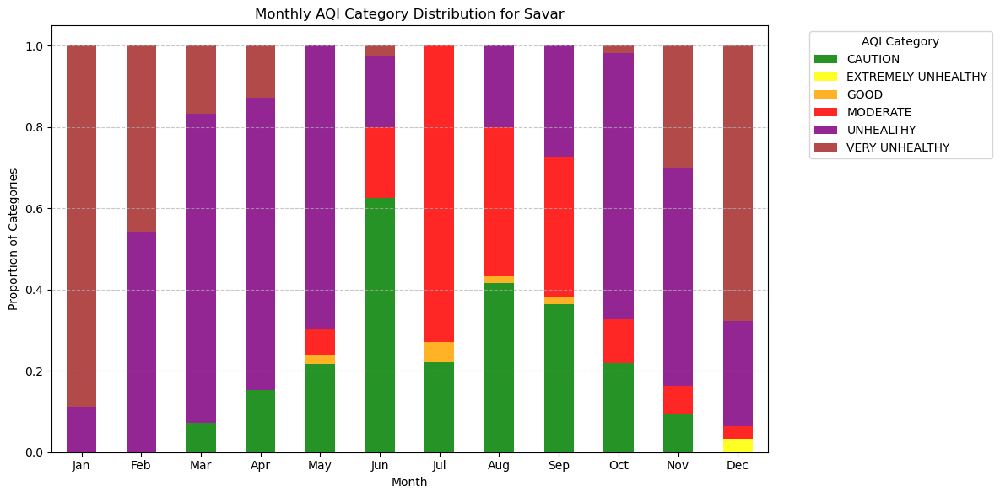

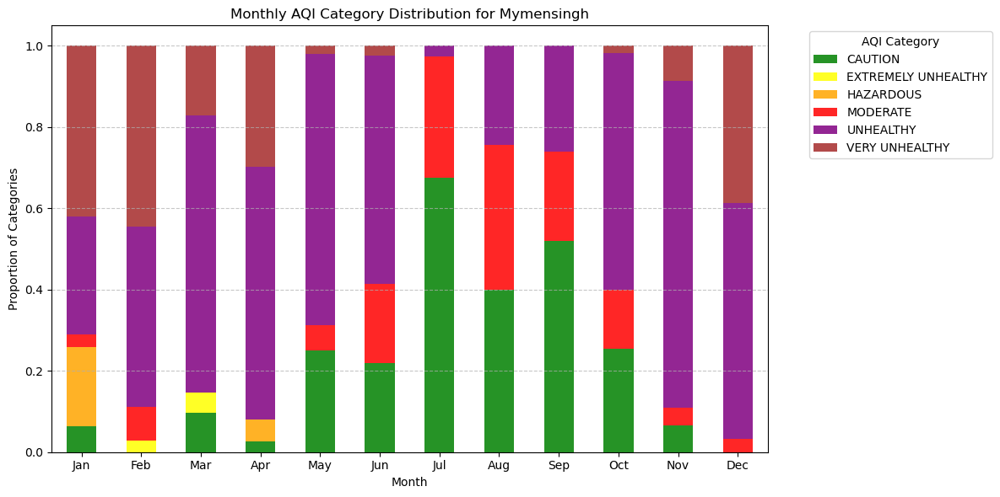

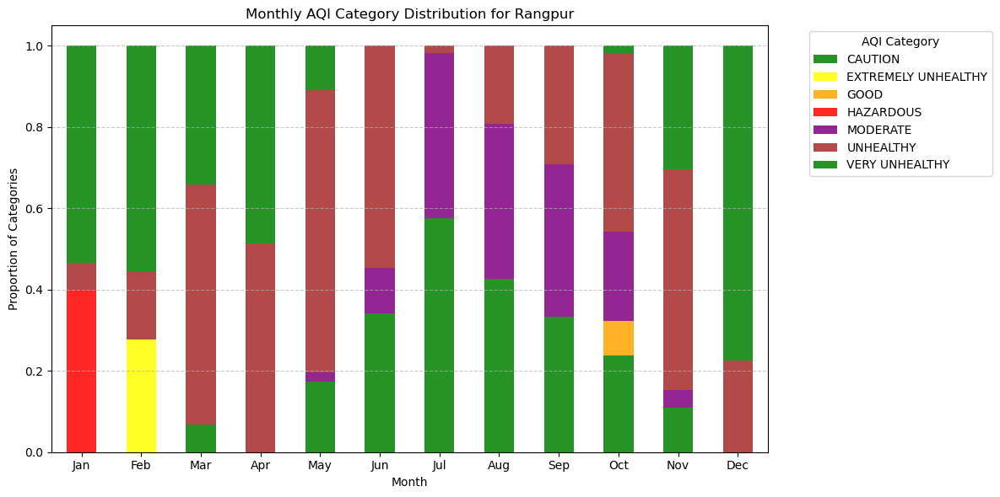

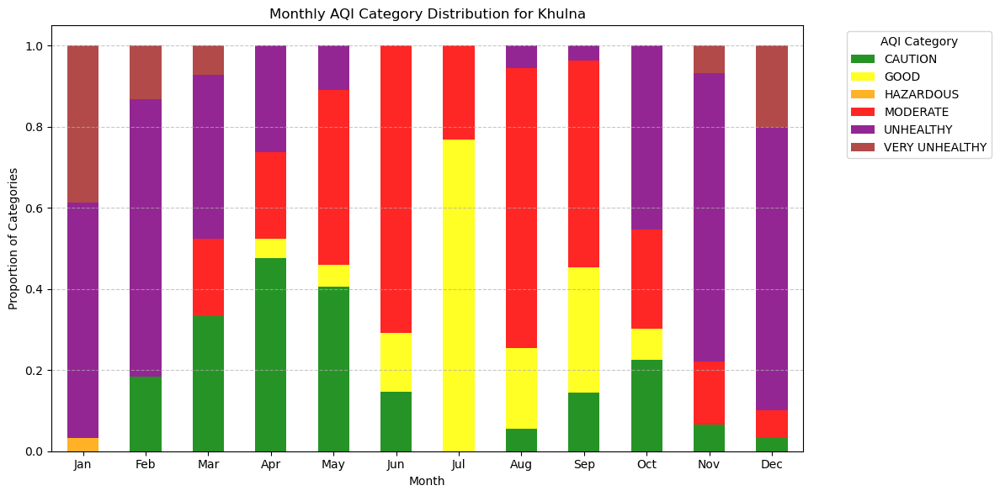

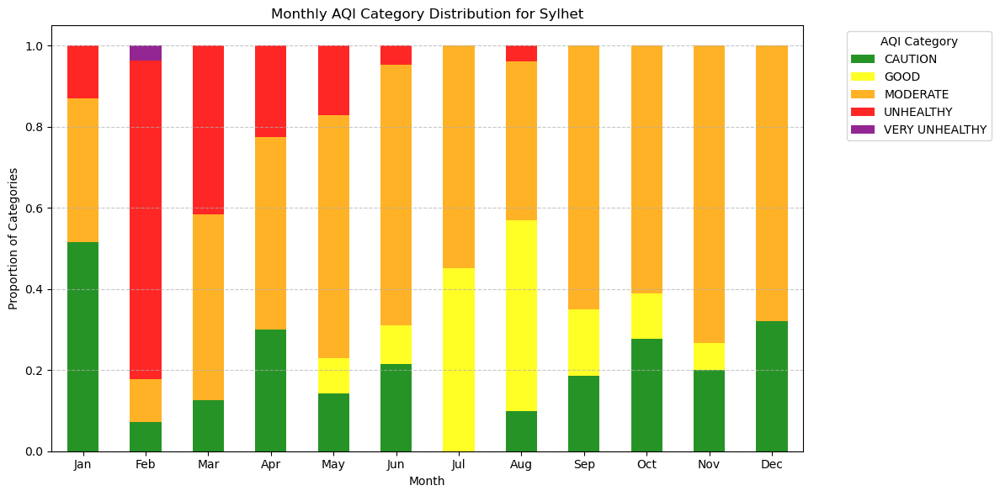

In [48]:
import seaborn as sns
import numpy as np

# Prepare data: filter out DNA and group by City, Month, and AQI Category
filtered_df = df[df['AQI Category'] != 'DNA']
filtered_df['Month'] = filtered_df['Date'].dt.month

# Get the list of unique cities
cities = filtered_df['City'].unique()

# Generate a stacked bar plot for each city
for city in cities:
    city_data = filtered_df[filtered_df['City'] == city]
    
    # Create a pivot table for AQI category counts by month
    pivot_table = city_data.pivot_table(index='Month', columns='AQI Category', aggfunc='size', fill_value=0)
    
    # Normalize counts for stacked proportions (optional)
    pivot_table_percentage = pivot_table.div(pivot_table.sum(axis=1), axis=0)
    
    # Plot the stacked bar chart
    pivot_table_percentage.plot(kind='bar', stacked=True, figsize=(12, 6), 
                                color=['green', 'yellow', 'orange', 'red', 'purple', 'brown'], alpha=0.85)
    plt.title(f'Monthly AQI Category Distribution for {city}')
    plt.xlabel('Month')
    plt.ylabel('Proportion of Categories')
    plt.xticks(ticks=np.arange(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=0)
    plt.legend(title='AQI Category', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()


AQI category sidtribution
TEchnically the whole dataset showed how much the air was poplluted mostly. 

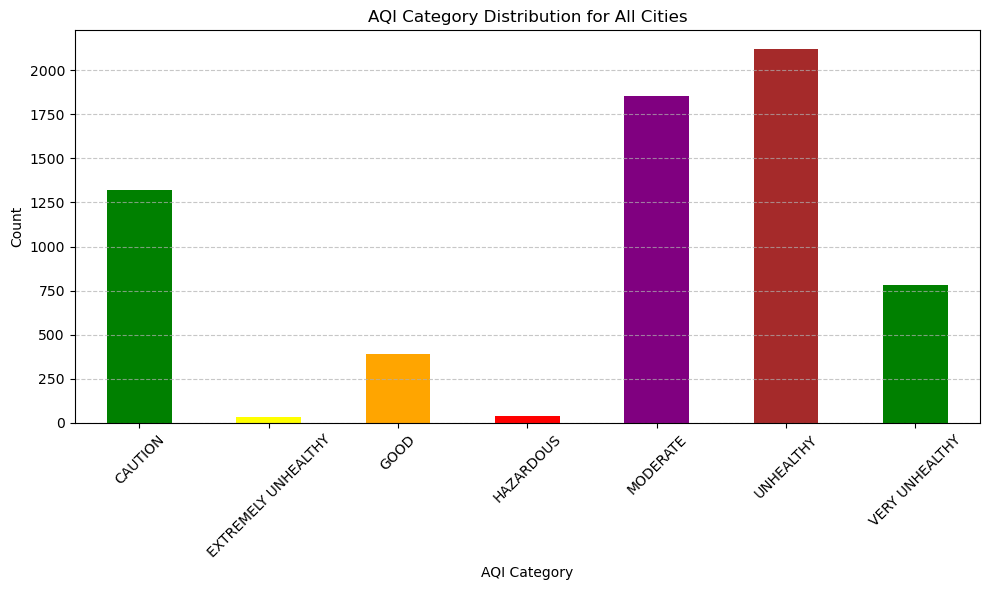

In [49]:
import pandas as pd
import matplotlib.pyplot as plt

# Filter out the DNA category
filtered_df = df[df['AQI Category'] != 'DNA']

# Aggregate category counts for all cities combined
category_counts = filtered_df.groupby('AQI Category').size()

# Plot the vertical stacked bar chart
plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', stacked=True, color=['green', 'yellow', 'orange', 'red', 'purple', 'brown'])
plt.title('AQI Category Distribution for All Cities')
plt.xlabel('AQI Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


AQI Category Distribution for each city

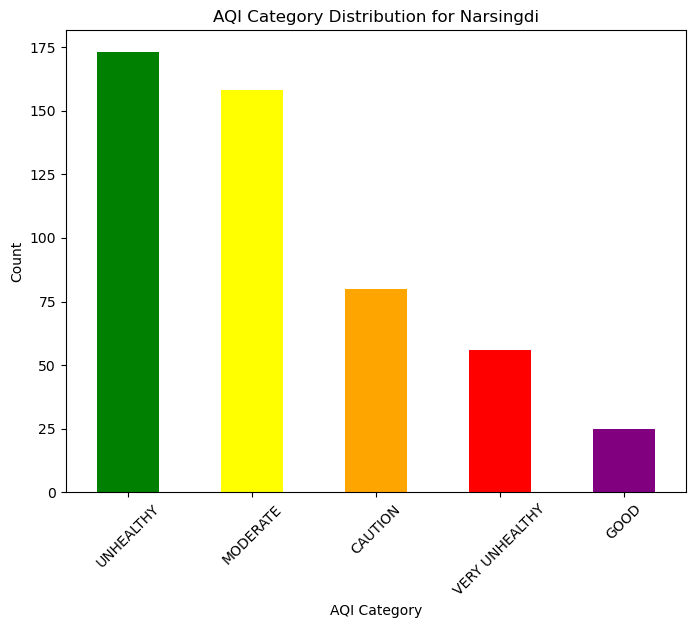

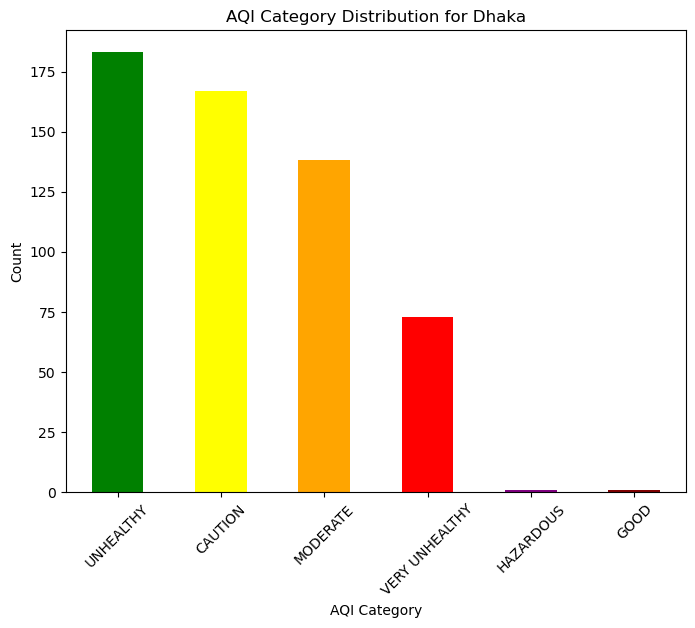

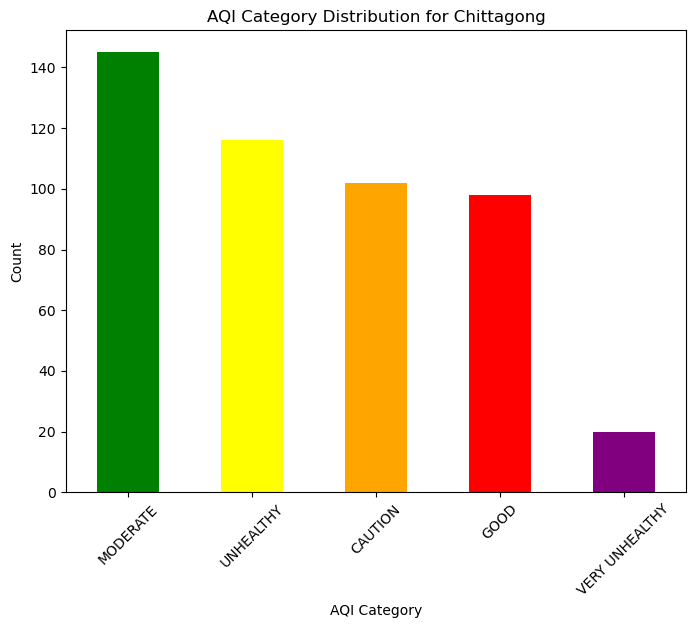

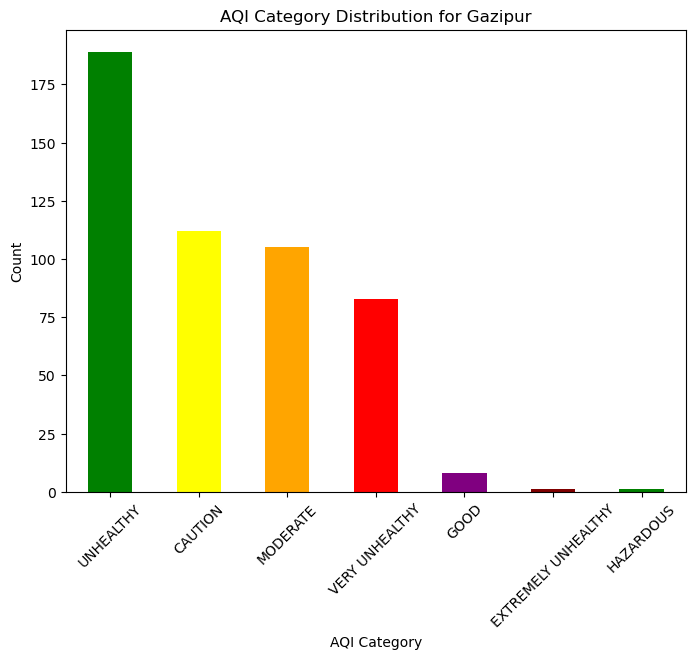

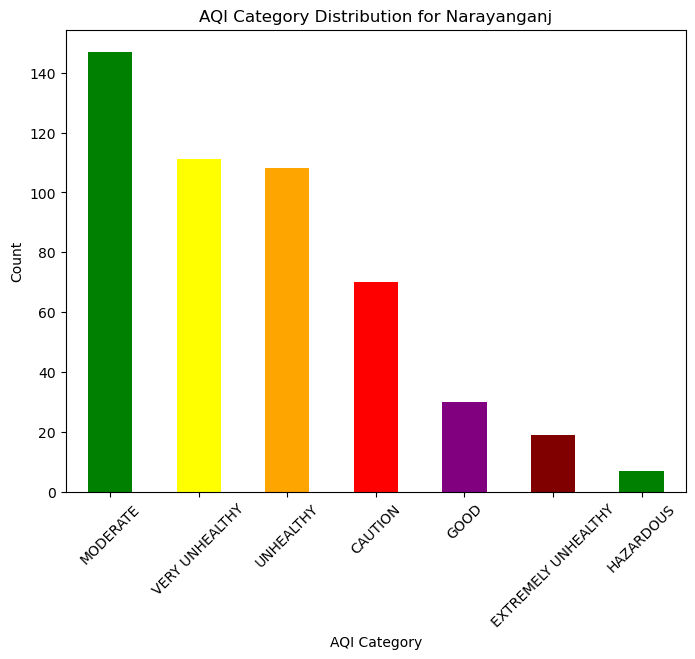

...

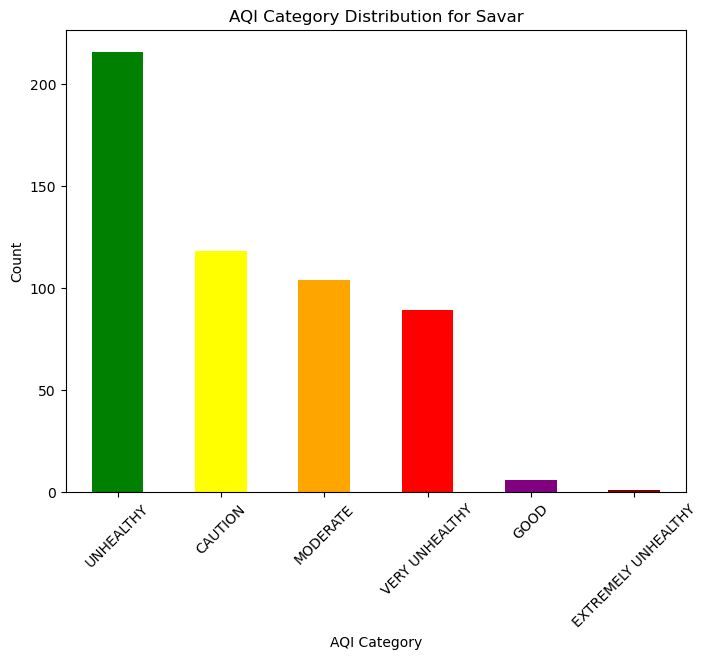

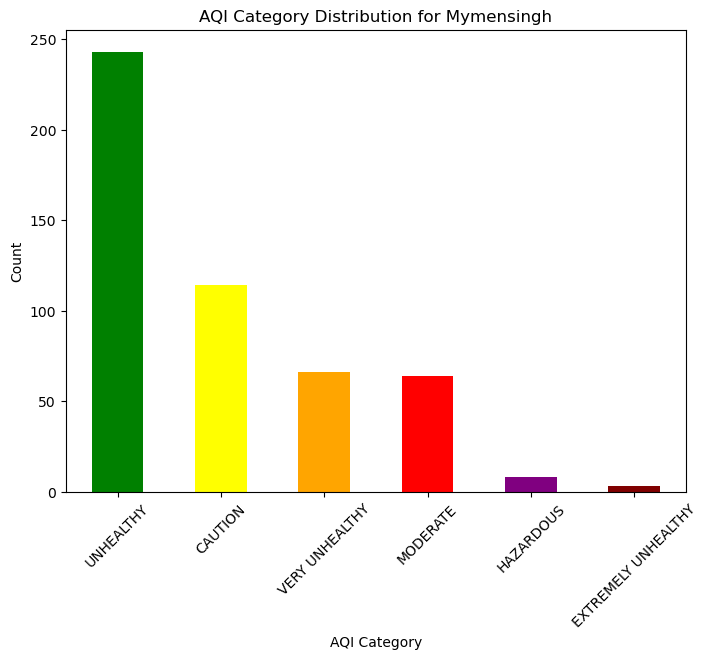

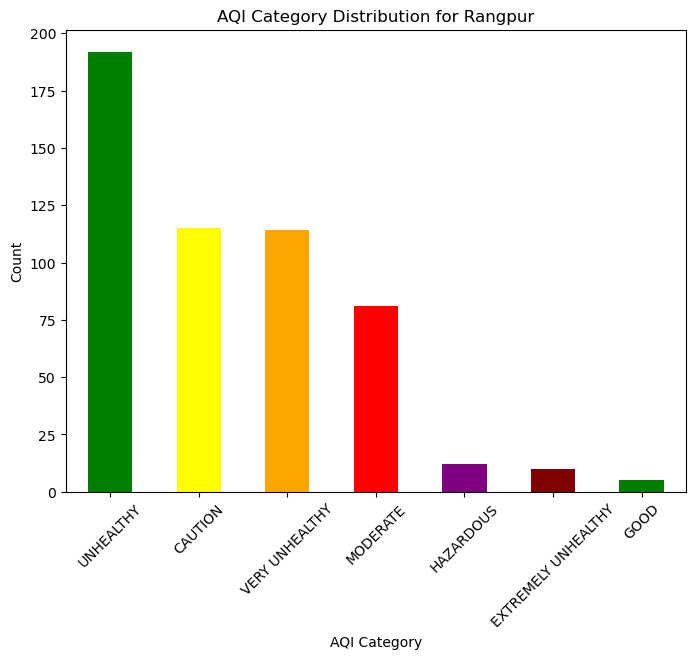

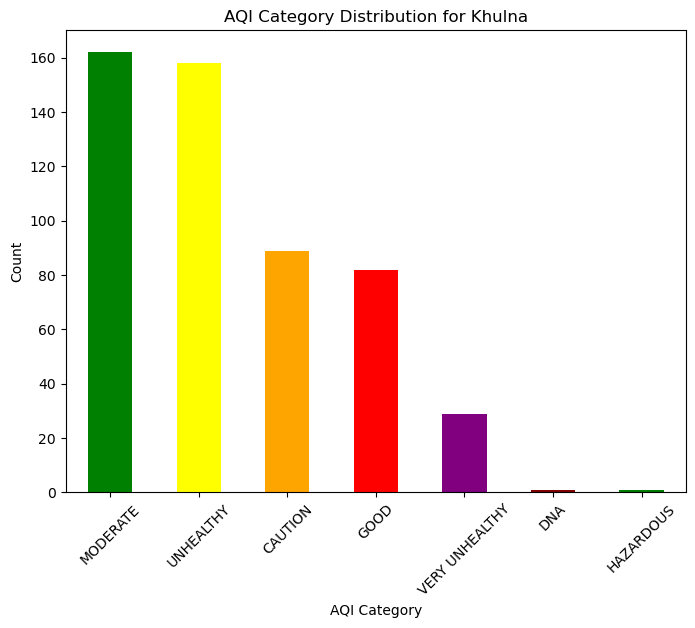

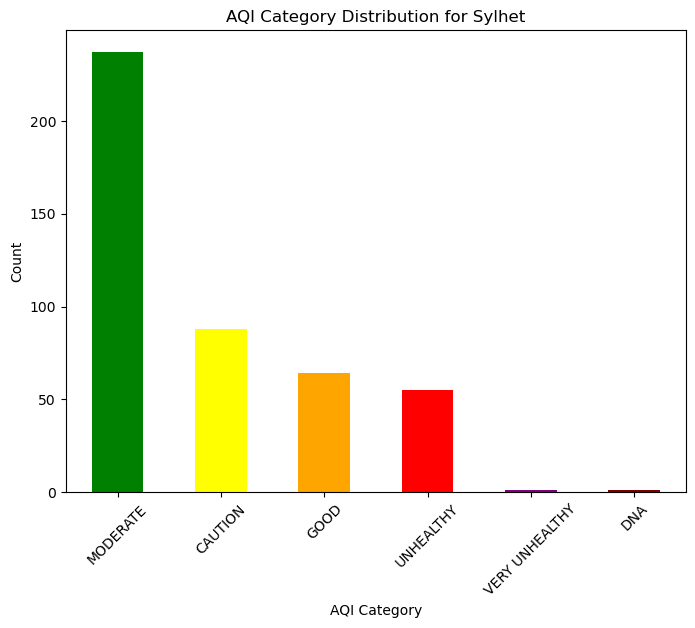

In [50]:
#Categorical Insights: Analyze AQI distribution by category (e.g., GOOD, MODERATE) for each city using stacked bar plots.

import matplotlib.pyplot as plt

# Loop through all 13 cities
for city in df['City'].unique():
    city_data = df[df['City'] == city].copy()
    
    # Count AQI Categories
    category_counts = city_data['AQI Category'].value_counts()
    
    # Plot Stacked Bar Chart
    category_counts.plot(kind='bar', stacked=True, figsize=(8, 6), color=['green', 'yellow', 'orange', 'red', 'purple', 'maroon'])
    plt.title(f"AQI Category Distribution for {city}")
    plt.xlabel("AQI Category")
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.show()


Anomaly Detection, It is used for outlier detection
In our dataset we have fixed the outlier to 5%, we are seeing the graph red marks denote outliers, 5%

Running anomaly detection for merged data...


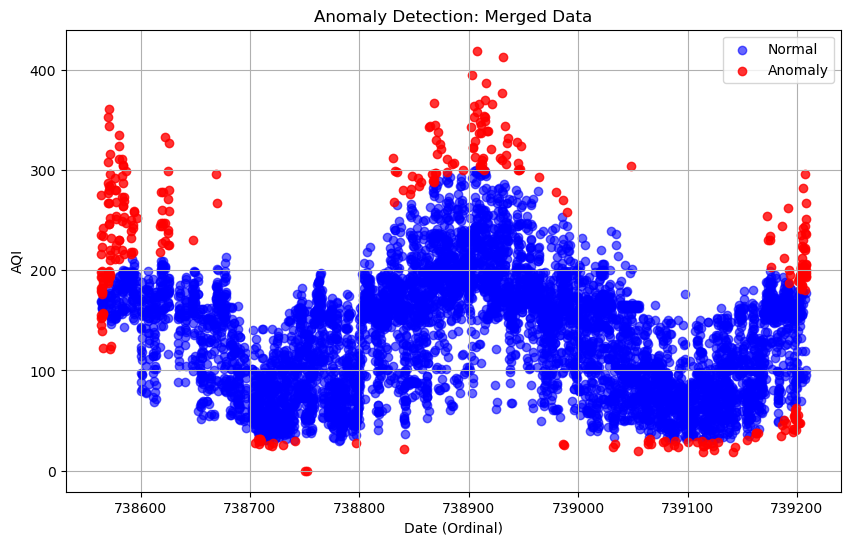

Running anomaly detection for individual cities...
Processing city: Narsingdi


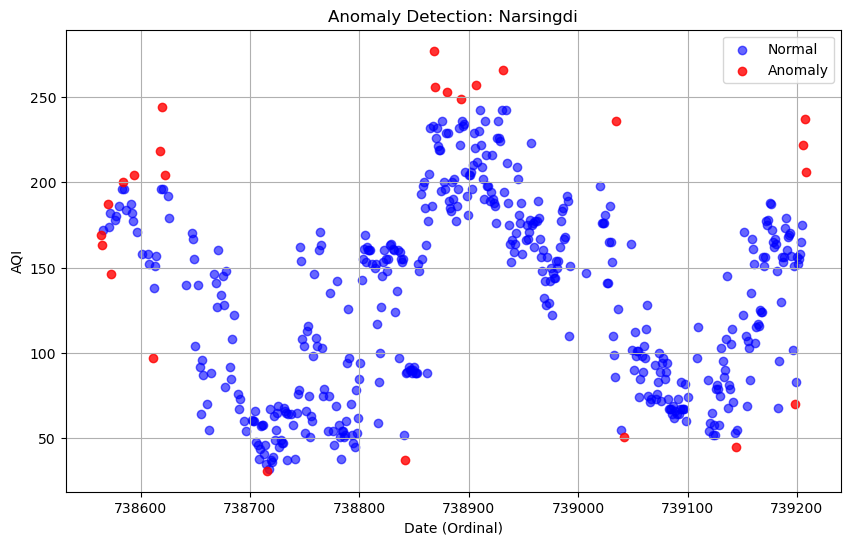

Processing city: Dhaka


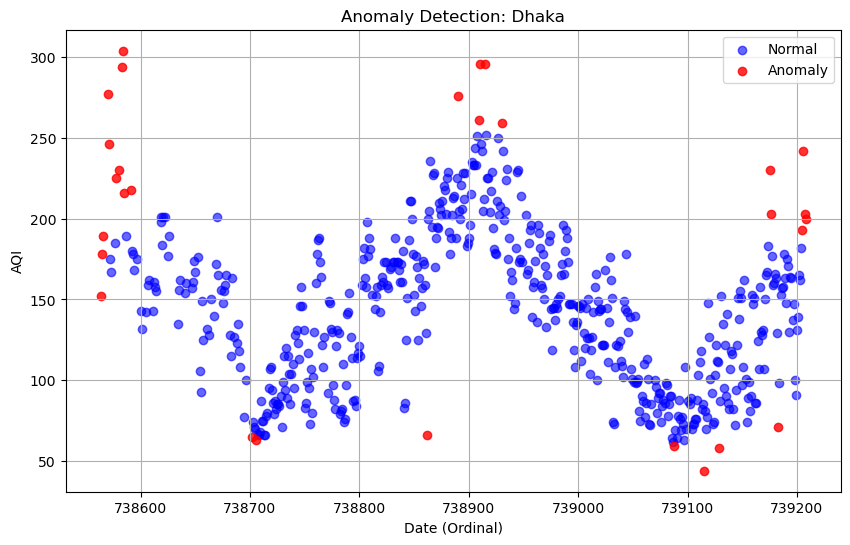

Processing city: Chittagong


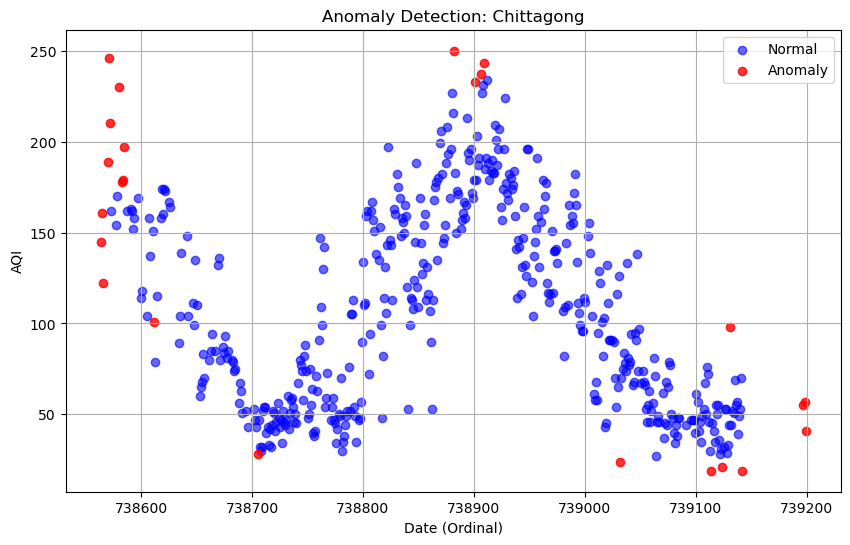

Processing city: Gazipur


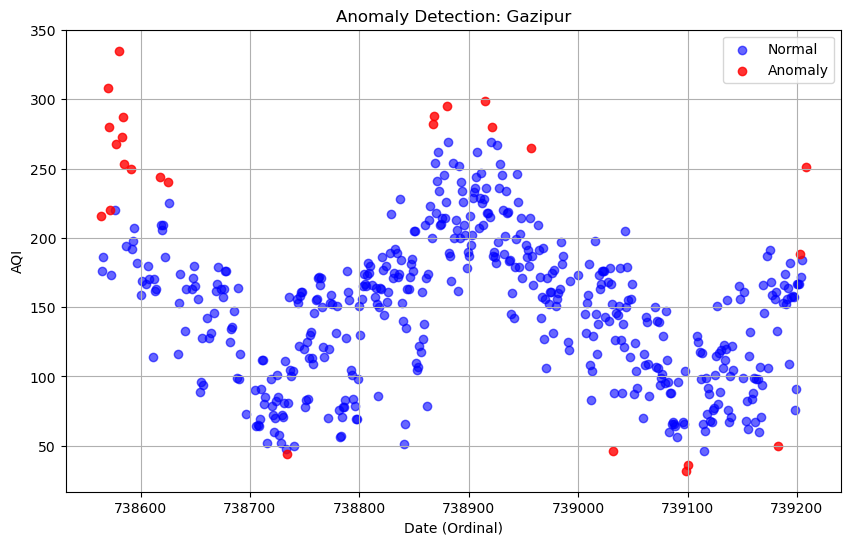

Processing city: Narayanganj


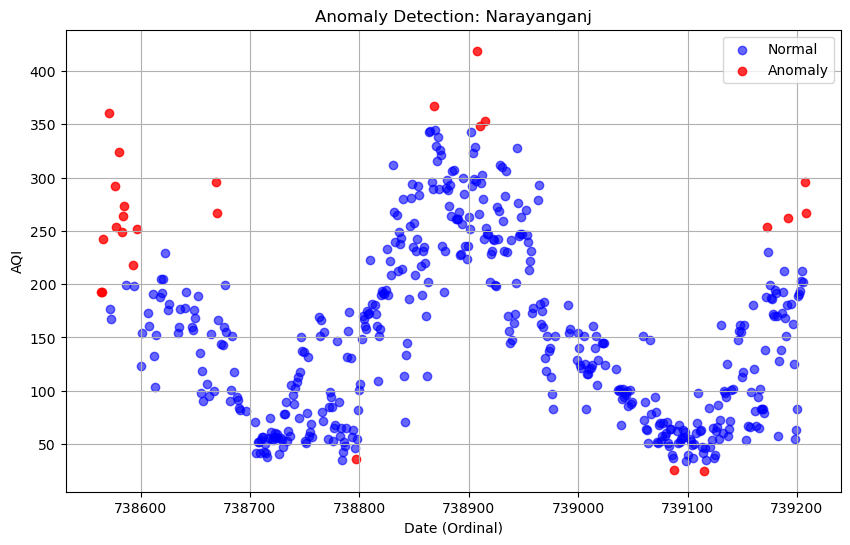

Processing city: Cumilla


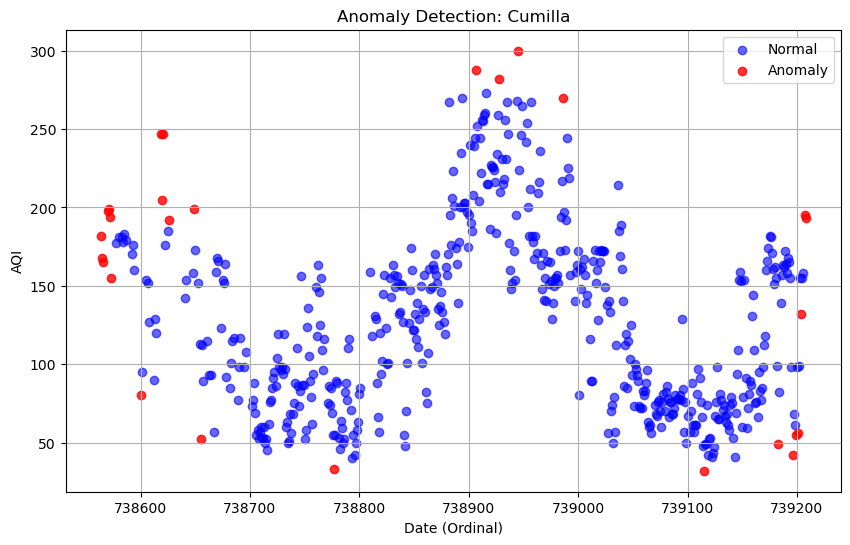

Processing city: Rajshahi


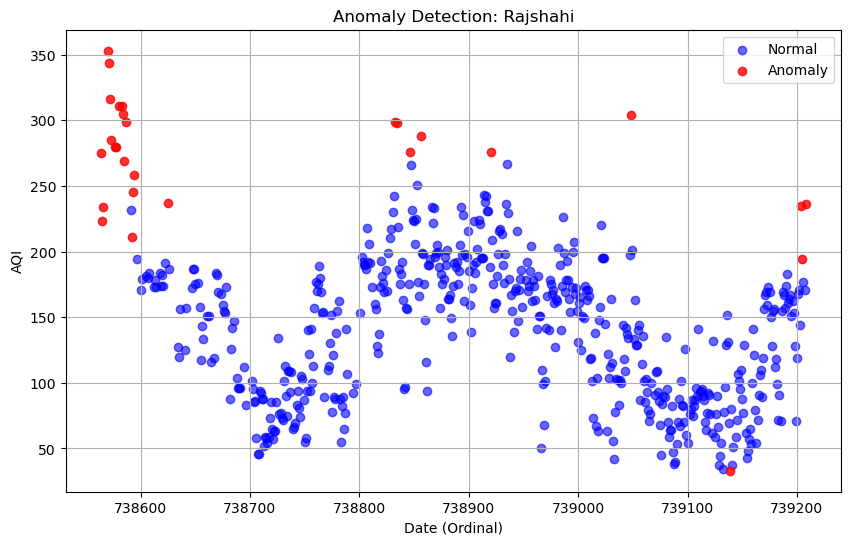

Processing city: Barishal


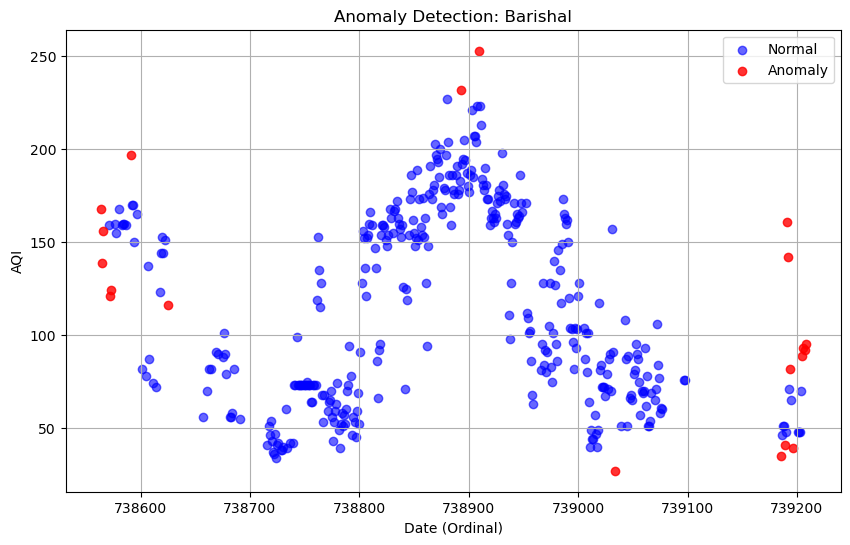

Processing city: Savar


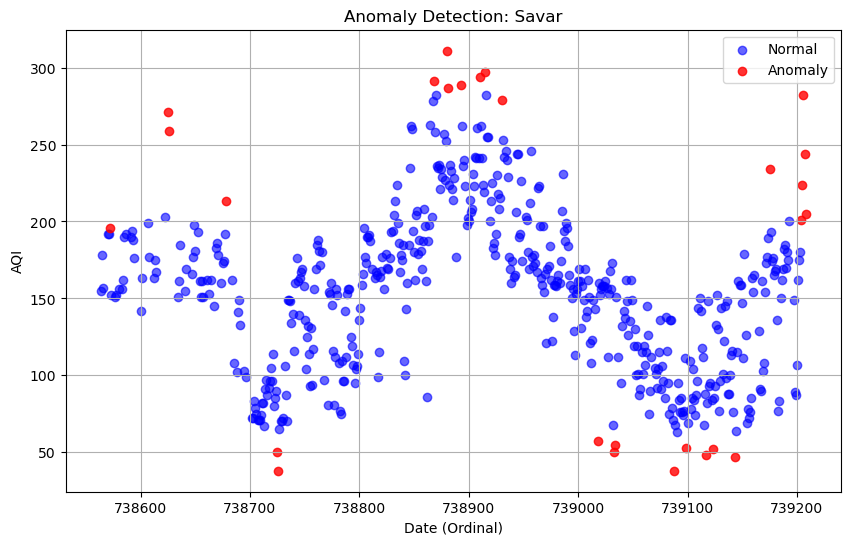

Processing city: Mymensingh


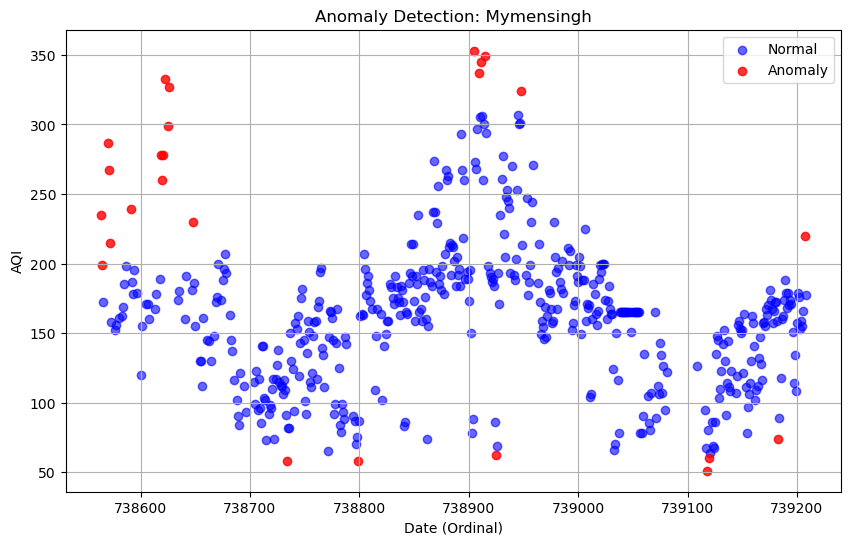

Processing city: Rangpur


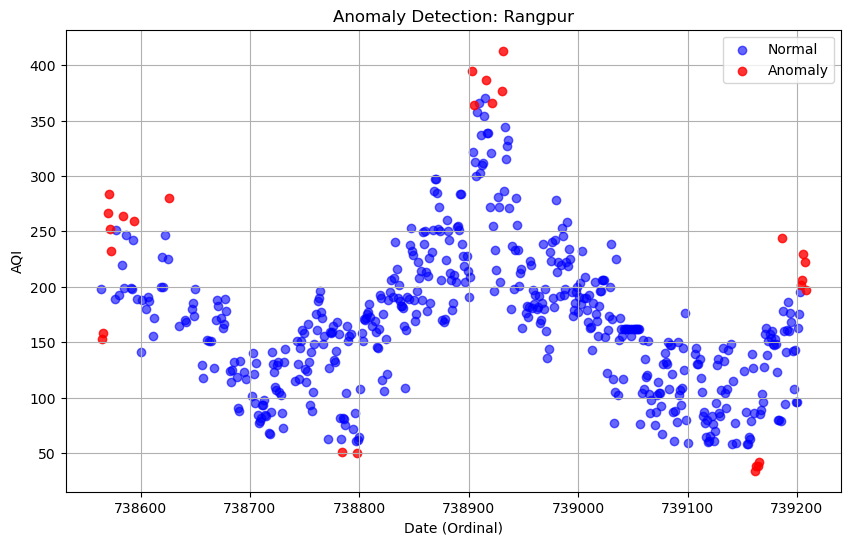

Processing city: Khulna


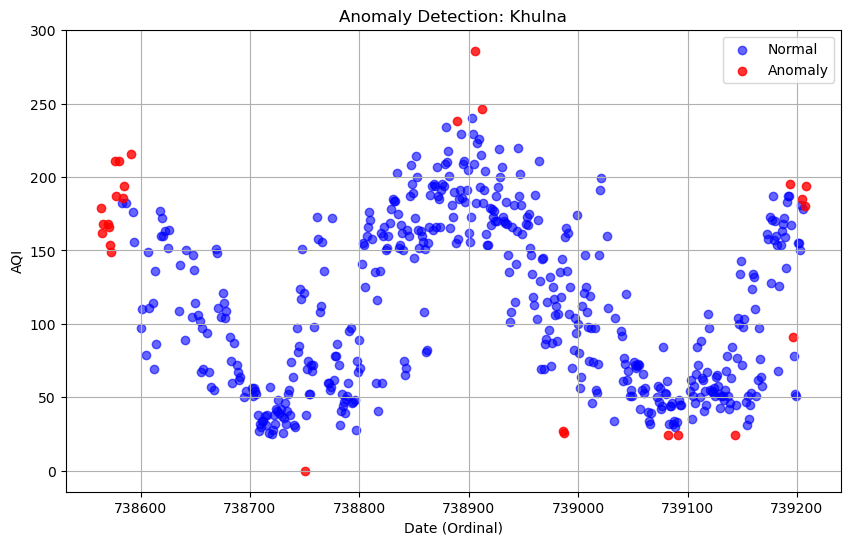

Processing city: Sylhet


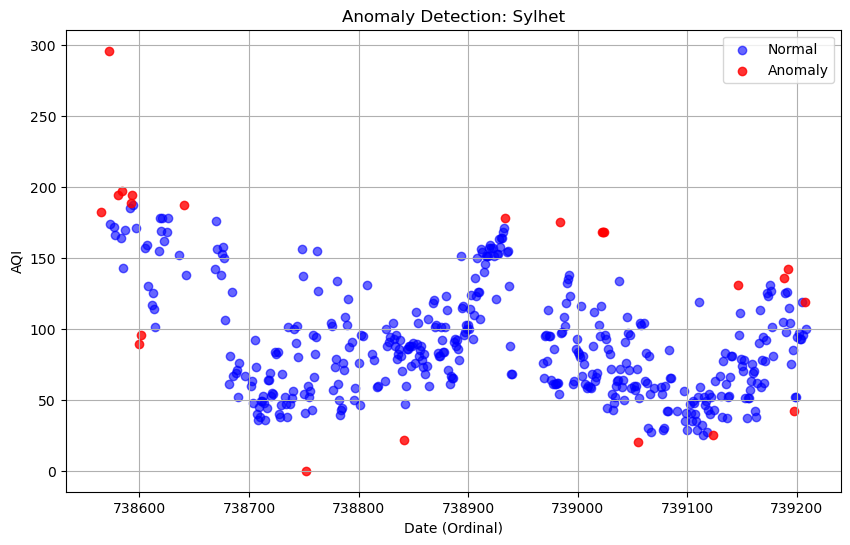

In [51]:
#Anomaly Detection: Use models like Isolation Forests to detect days with unusual AQI spikes or outliers.


# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest

# Load the data (replace 'your_data.csv' with the path to your dataset)
# df = pd.read_csv('your_data.csv')

# Filter necessary columns (Date, City, AQI)
df = df[['Date', 'City', 'AQI', 'Responsible Pollutant']].dropna()

# Convert Date to numerical format for time series (ordinal encoding)
df['Date_Ordinal'] = pd.to_datetime(df['Date']).map(pd.Timestamp.toordinal)

# Function for anomaly detection
def detect_anomalies(data, title, contamination=0.05):
    """
    Detects anomalies using Isolation Forest.
    Parameters:
        data (DataFrame): The dataset with 'Date_Ordinal' and 'AQI'.
        title (str): Title for the visualization.
        contamination (float): Proportion of outliers in the data.
    Returns:
        DataFrame: Data with an additional 'Anomaly' column.
    """
    # Prepare data for Isolation Forest
    features = data[['Date_Ordinal', 'AQI']].values

    # Initialize Isolation Forest
    iso_forest = IsolationForest(contamination=contamination, random_state=42)
    data['Anomaly'] = iso_forest.fit_predict(features)  # -1 for anomaly, 1 for normal

    # Plot results
    plt.figure(figsize=(10, 6))
    normal_data = data[data['Anomaly'] == 1]
    anomaly_data = data[data['Anomaly'] == -1]
    plt.scatter(normal_data['Date_Ordinal'], normal_data['AQI'], label='Normal', color='blue', alpha=0.6)
    plt.scatter(anomaly_data['Date_Ordinal'], anomaly_data['AQI'], label='Anomaly', color='red', alpha=0.8)
    plt.title(f"Anomaly Detection: {title}")
    plt.xlabel('Date (Ordinal)')
    plt.ylabel('AQI')
    plt.legend()
    plt.grid()
    plt.show()

    return data

# Anomaly Detection for Merged Data
print("Running anomaly detection for merged data...")
merged_data = df[['Date_Ordinal', 'AQI']].copy()
merged_data = detect_anomalies(merged_data, title="Merged Data")

# Anomaly Detection for Individual Cities
print("Running anomaly detection for individual cities...")
for city in df['City'].unique():
    print(f"Processing city: {city}")
    city_data = df[df['City'] == city][['Date_Ordinal', 'AQI']].copy()
    city_data = detect_anomalies(city_data, title=city)


PM2.5 vs PM10, mainly statistical analysis, search youtube and via t score and p score analyze wither the two parameters are statistically dependent or not. 

Paired T-Test Results:
T-Statistic: 3.873, P-Value: 0.004


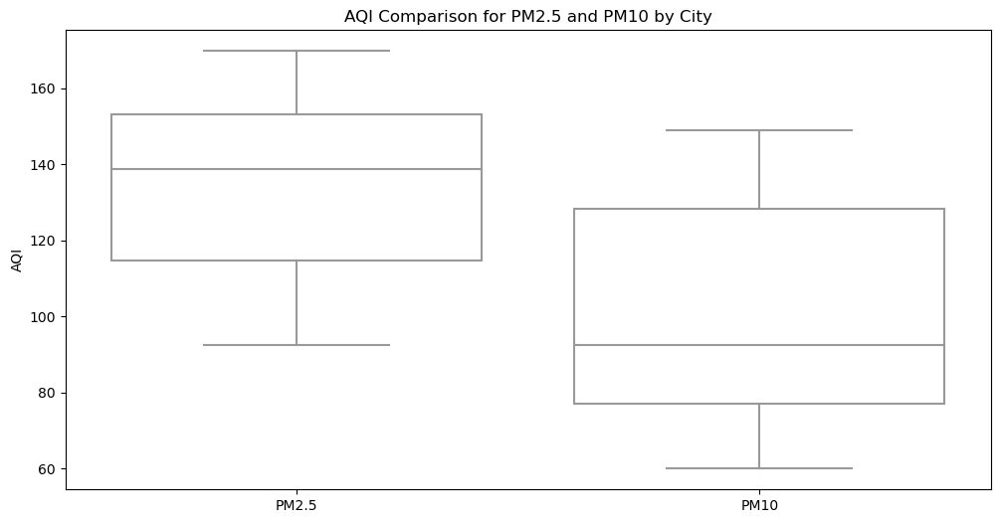

The difference in AQI between PM2.5 and PM10 is statistically significant.


In [52]:
#PM2.5 vs. PM10: Perform statistical hypothesis testing (e.g., paired t-tests) to determine if AQI distributions differ significantly.

import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for PM2.5 and PM10
pm25_data = df[df['Responsible Pollutant'] == 'PM2.5']
pm10_data = df[df['Responsible Pollutant'] == 'PM10']

# Prepare datasets for paired t-test
city_pm25 = pm25_data.groupby('City')['AQI'].mean()
city_pm10 = pm10_data.groupby('City')['AQI'].mean()

# Ensure the cities match for paired comparison
paired_data = pd.DataFrame({
    'PM2.5': city_pm25,
    'PM10': city_pm10
}).dropna()  # Drop cities with missing data

# Perform Paired T-Test
t_stat, p_value = stats.ttest_rel(paired_data['PM2.5'], paired_data['PM10'])

print("Paired T-Test Results:")
print(f"T-Statistic: {t_stat:.3f}, P-Value: {p_value:.3f}")

# Visualize the AQI distributions for PM2.5 and PM10
plt.figure(figsize=(12, 6))
sns.boxplot(data=paired_data, palette=['white', 'white'])
plt.title("AQI Comparison for PM2.5 and PM10 by City")
plt.ylabel("AQI")
plt.xticks([0, 1], ['PM2.5', 'PM10'])
plt.show()

# Hypothesis Testing Summary
if p_value < 0.05:
    print("The difference in AQI between PM2.5 and PM10 is statistically significant.")
else:
    print("No significant difference in AQI between PM2.5 and PM10.")


AQI Distribution for PM2.5 vs PM10 by City, In this dataset, we want to see, by citywise which pollutant had more impactin a specific city

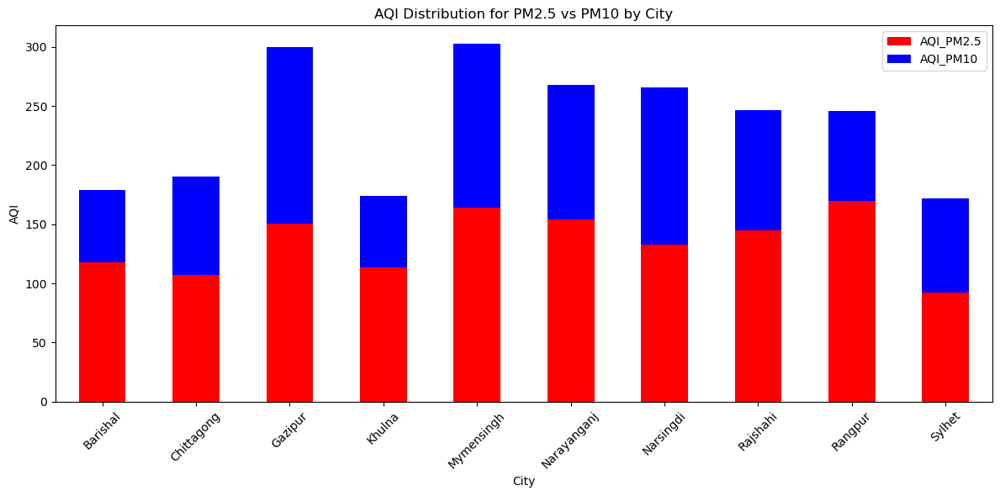

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Filter data for PM2.5 and PM10
pm25_data = df[df['Responsible Pollutant'] == 'PM2.5']
pm10_data = df[df['Responsible Pollutant'] == 'PM10']

# Group data by city and calculate the mean AQI for PM2.5 and PM10
pm25_avg = pm25_data.groupby('City')['AQI'].mean().reset_index()
pm10_avg = pm10_data.groupby('City')['AQI'].mean().reset_index()

# Merge both datasets for comparison
city_avg = pd.merge(pm25_avg, pm10_avg, on='City', suffixes=('_PM2.5', '_PM10'))

# Plot
#plt.figure(figsize=(12, 6))
#sns.barplot(x='City', y='AQI_PM2.5', data=city_avg, color='red', label='PM2.5')
#sns.barplot(x='City', y='AQI_PM10', data=city_avg, color='blue', label='PM10')

#plt.title('Average AQI for PM2.5 vs PM10 by City')
#plt.ylabel('AQI')
#plt.xticks(rotation=45)
#plt.legend()
#plt.show()



# Plot stacked bar plot for AQI from PM2.5 and PM10 per city
city_avg.set_index('City')[['AQI_PM2.5', 'AQI_PM10']].plot(kind='bar', stacked=True, figsize=(12, 6), color=['red', 'blue'])

plt.title('AQI Distribution for PM2.5 vs PM10 by City')
plt.ylabel('AQI')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


# Advanced EDA, You Need to study to write a bit

K means clustering, here we have taken elbow value 4 thus we generated the clusters based on k value 4

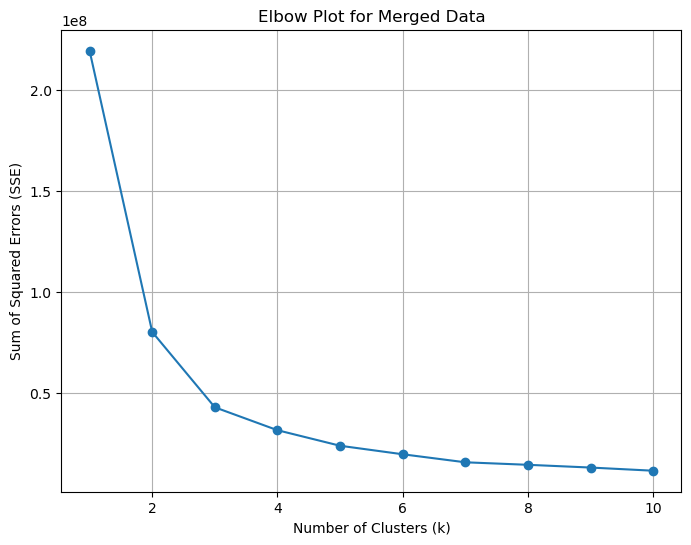

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

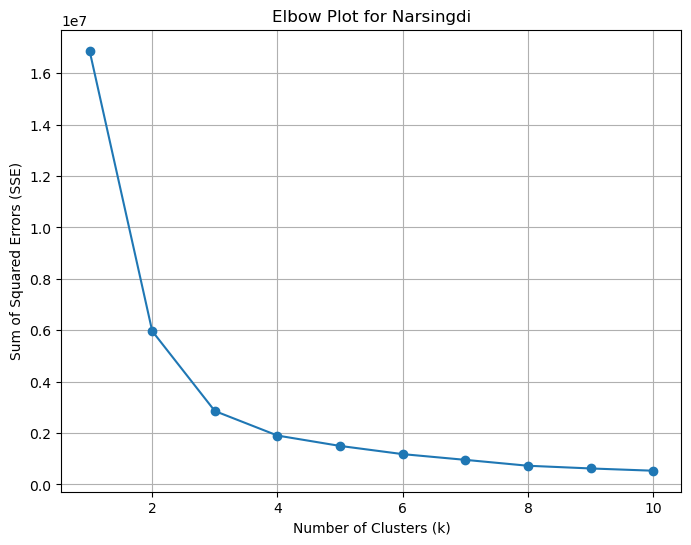

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

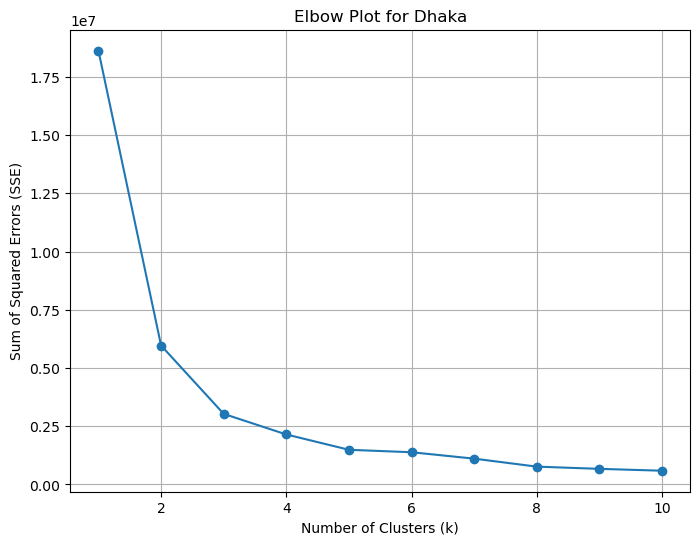

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

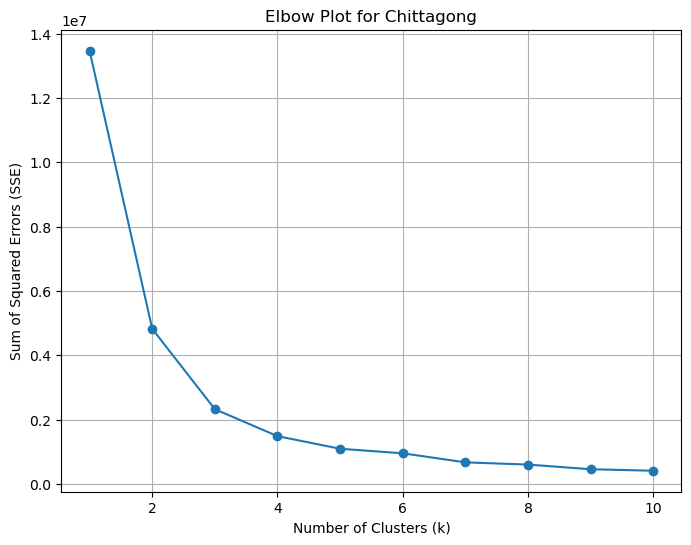

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

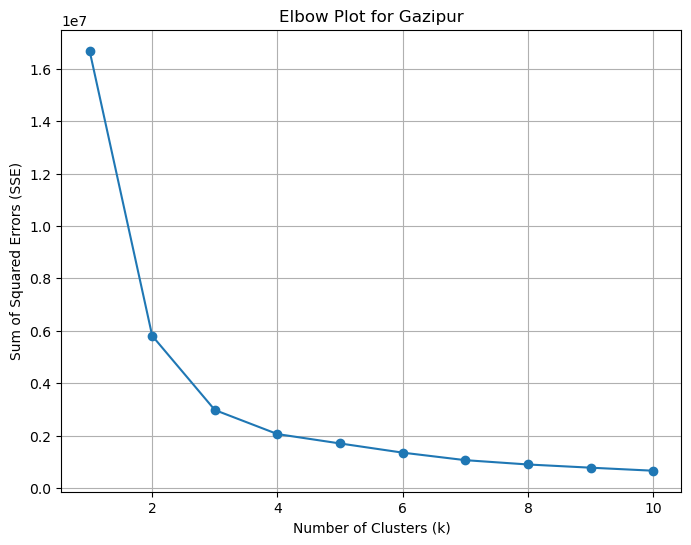

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

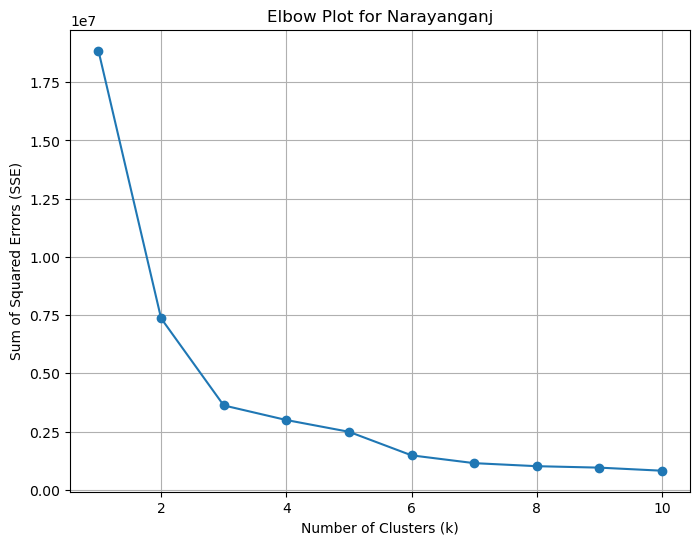

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

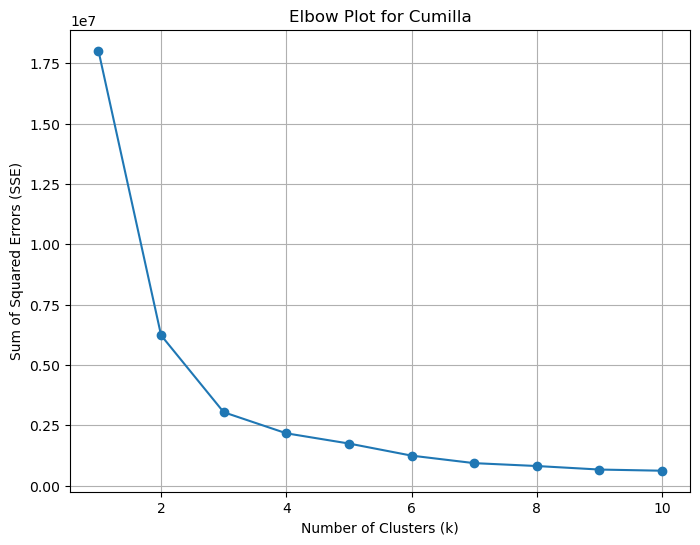

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

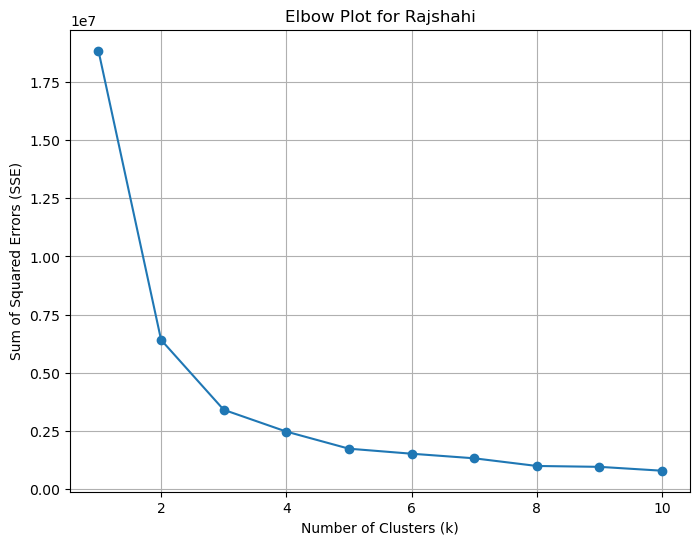

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

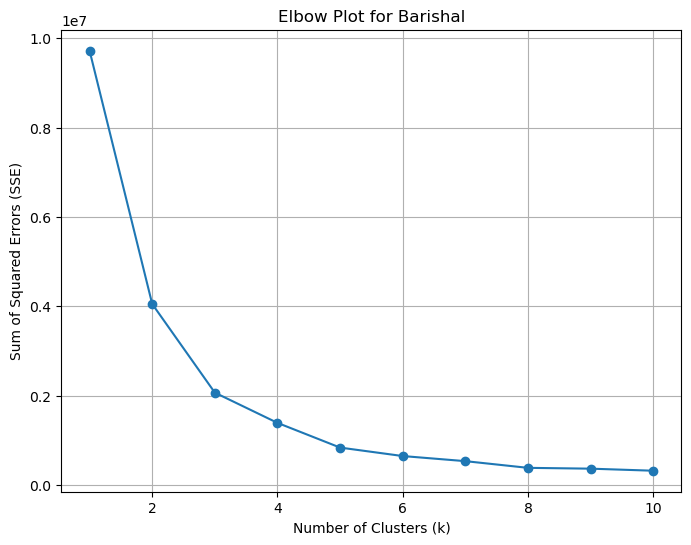

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

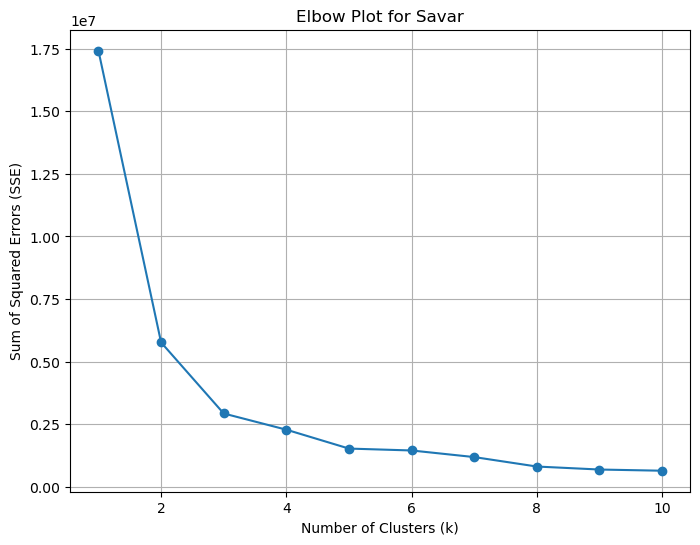

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

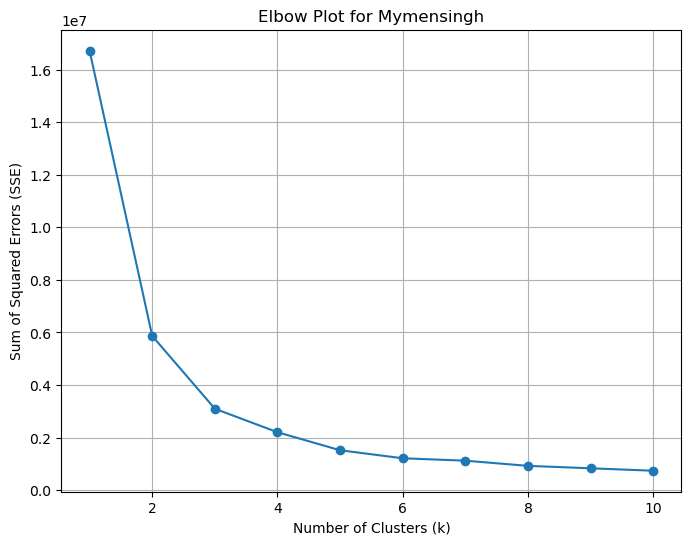

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

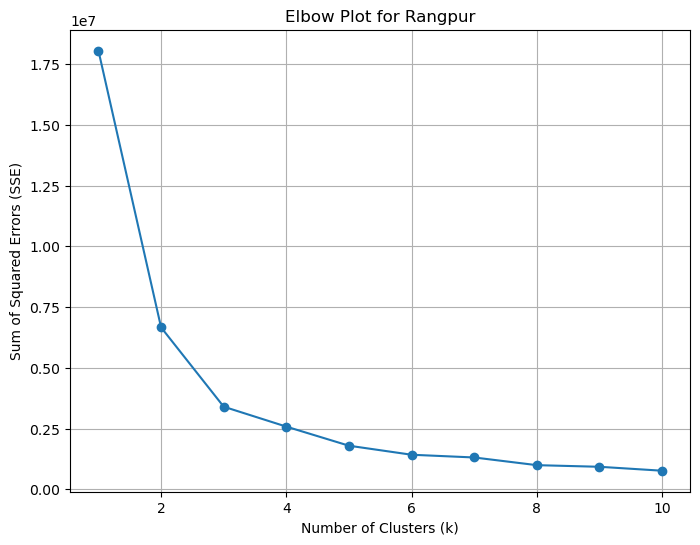

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

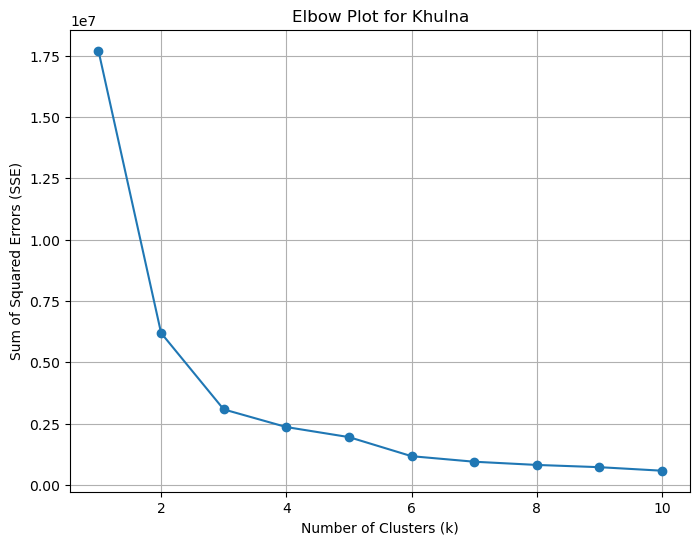

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

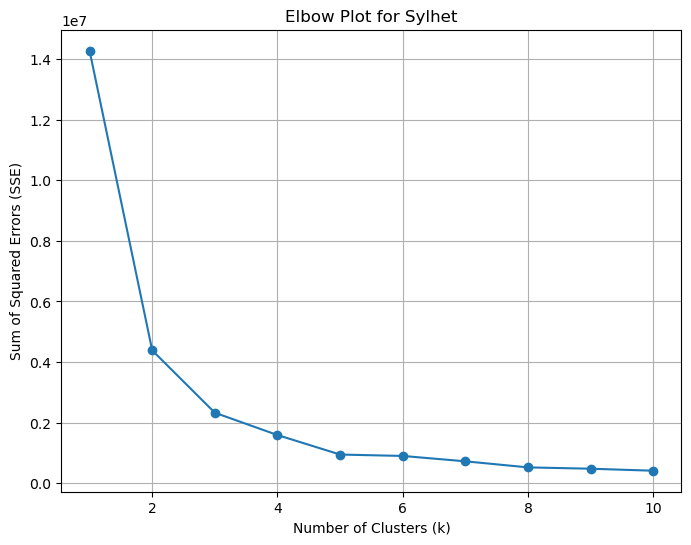

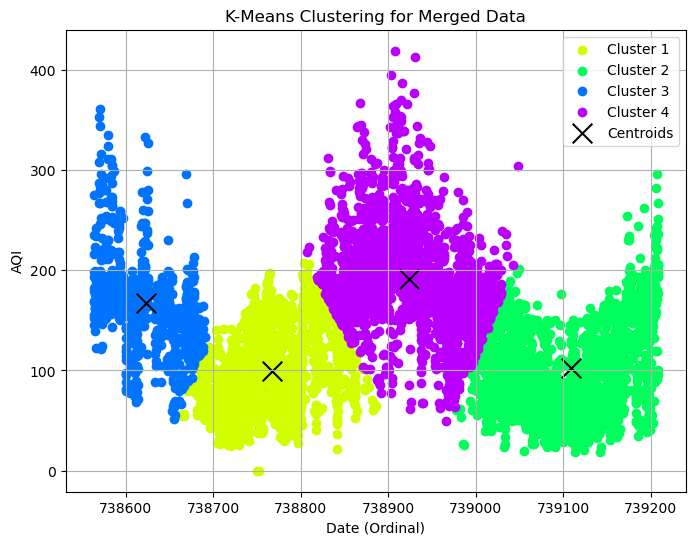

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


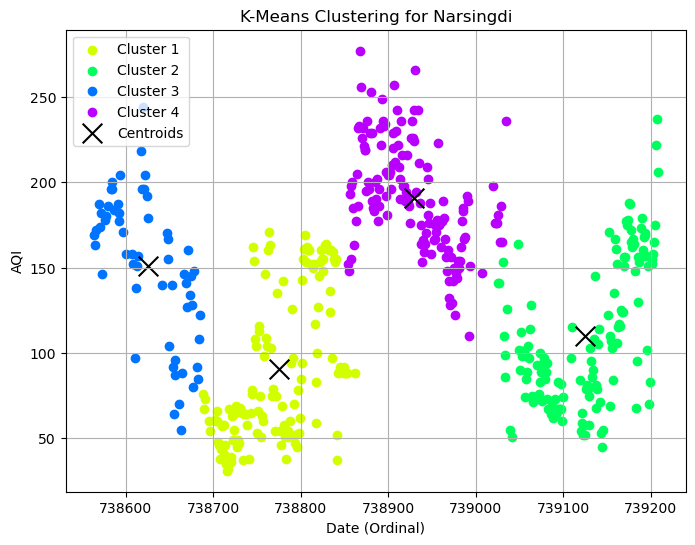

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


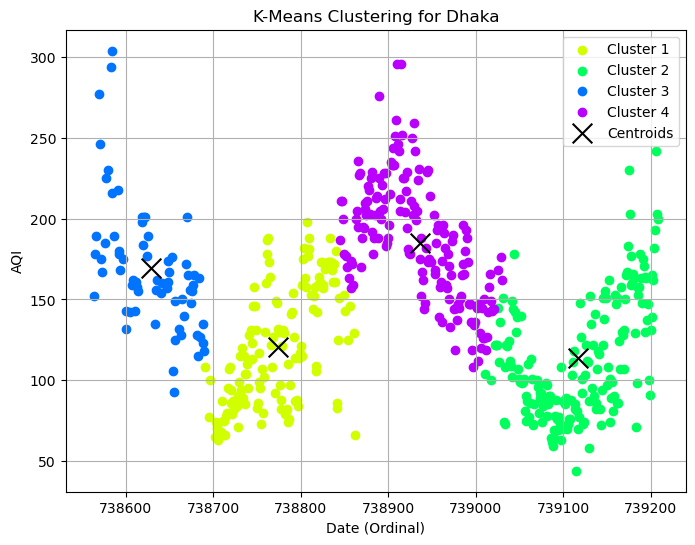

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


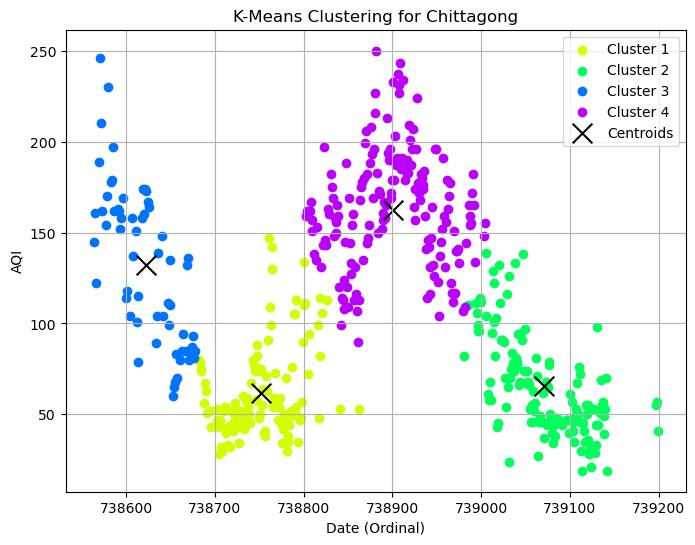

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


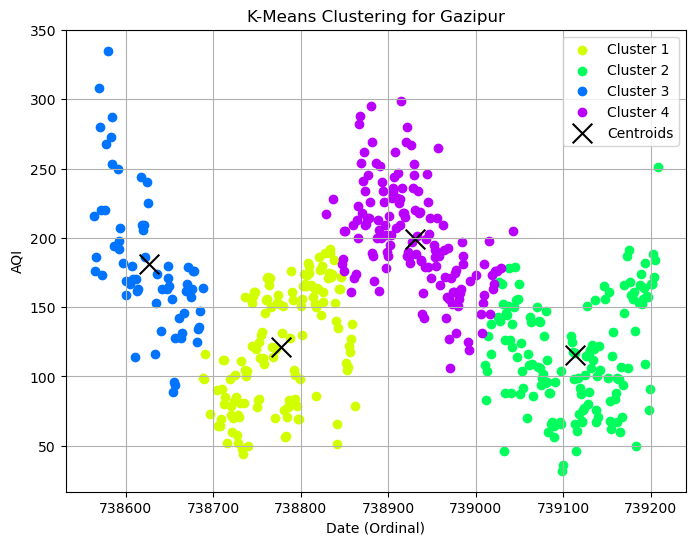

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


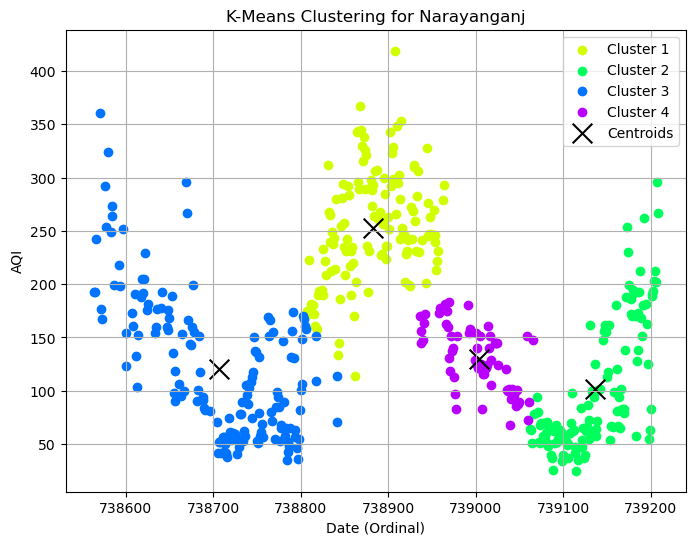

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


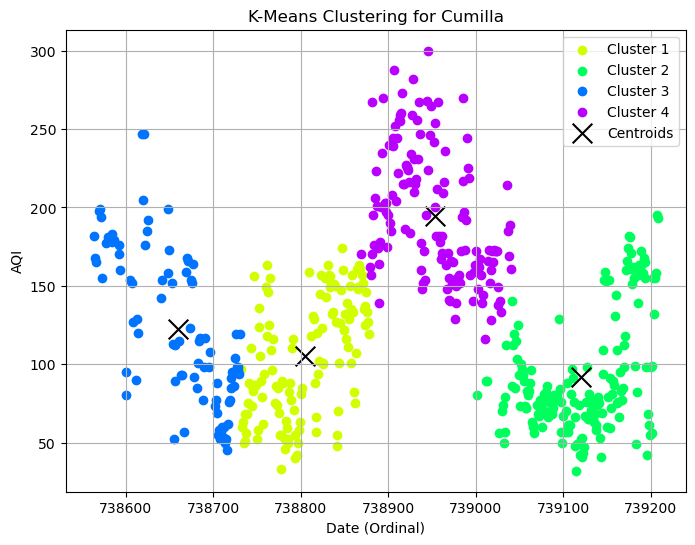

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


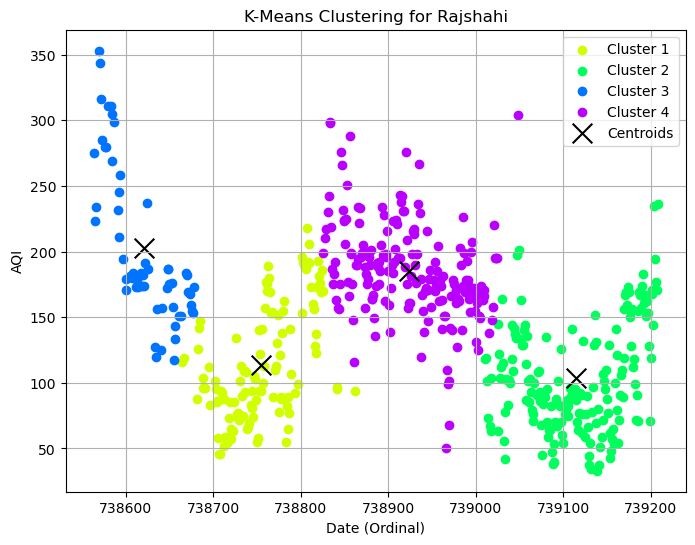

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


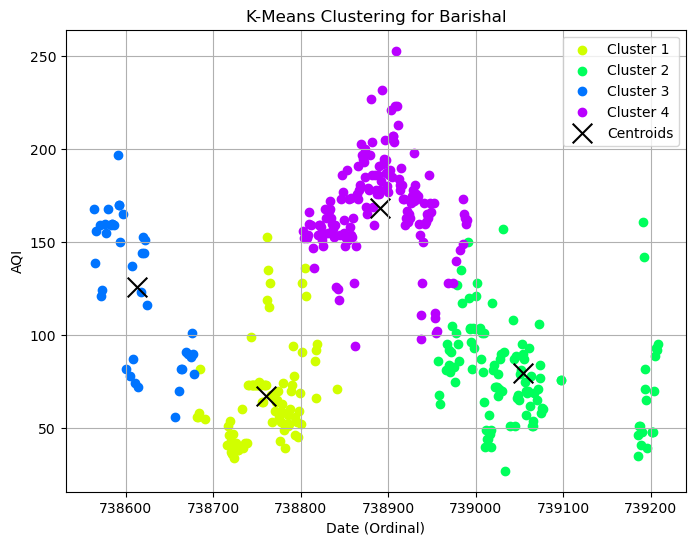

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


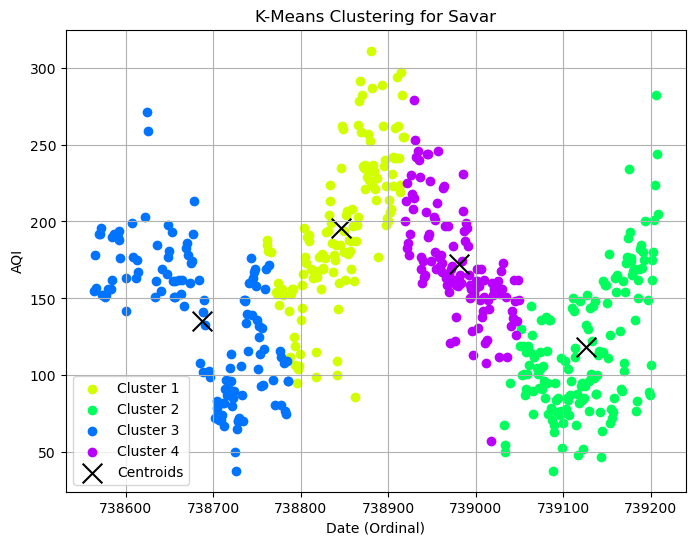

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


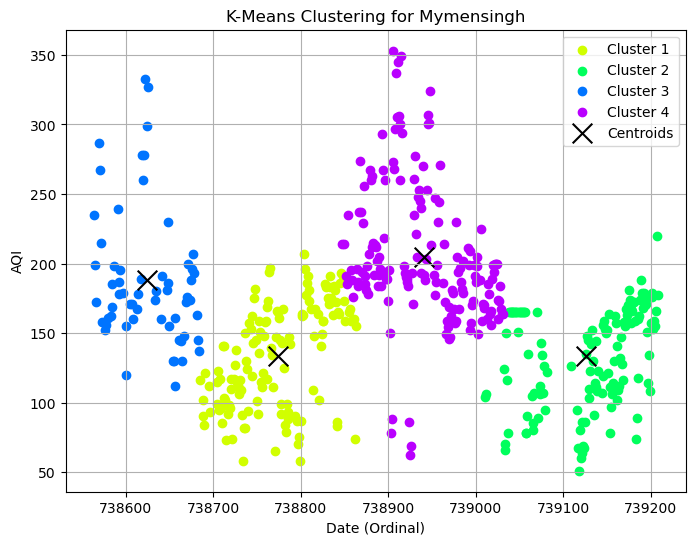

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


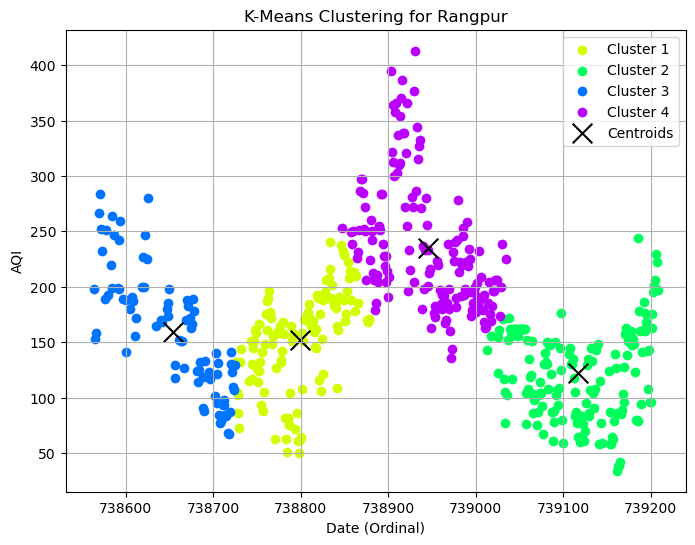

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


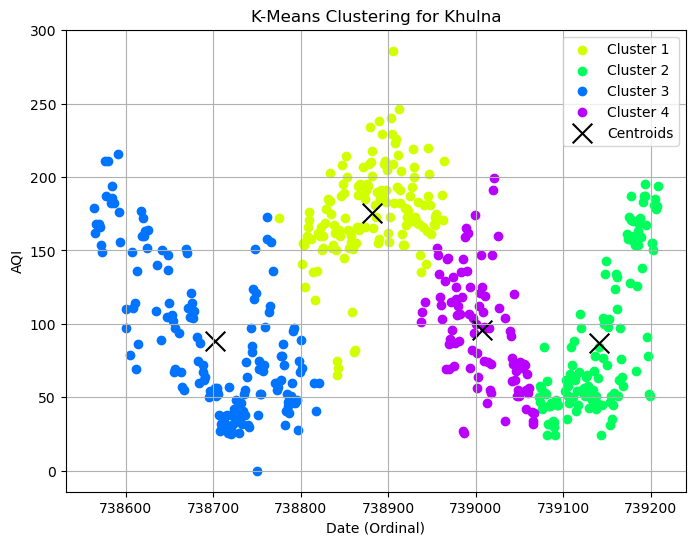

C:\Users\Acer\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


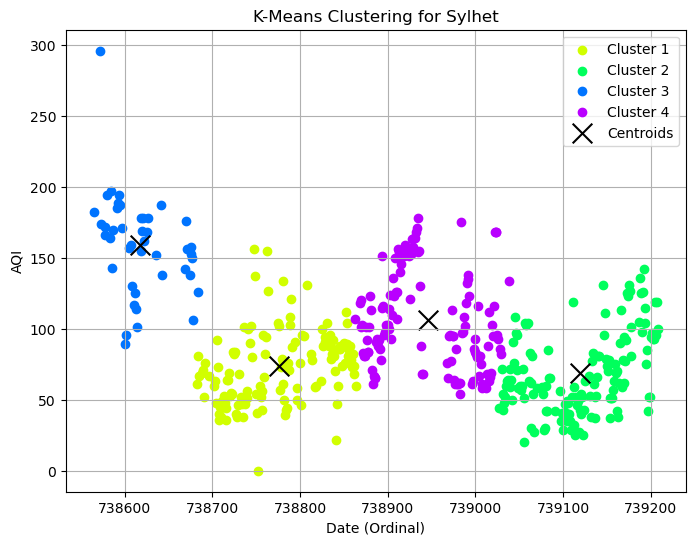

In [54]:
#Clustering Analysis: Apply k-means clustering to group cities based on AQI patterns or pollutant dominance.

# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data (replace 'your_data.csv' with the path to your dataset)
#df = pd.read_csv('your_data.csv')

# Filter necessary columns (Date and AQI assumed here; adjust as per your dataset structure)
# Replace 'Date', 'City', 'AQI' with actual column names
df = df[['Date', 'City', 'AQI', 'Responsible Pollutant']].dropna()

# Convert Date to numerical format for clustering purposes (use ordinal encoding)
df['Date_Ordinal'] = pd.to_datetime(df['Date']).map(pd.Timestamp.toordinal)

# Function to create an elbow plot
def generate_elbow_plot(data, title):
    sse = []
    k_rng = range(1, 11)  # Testing k values from 1 to 10
    for k in k_rng:
        km = KMeans(n_clusters=k, random_state=42)
        km.fit(data)
        sse.append(km.inertia_)
    plt.figure(figsize=(8, 6))
    plt.plot(k_rng, sse, marker='o')
    plt.title(title)
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Sum of Squared Errors (SSE)')
    plt.grid()
    plt.show()

# Elbow Plot for Merged Data
merged_data = df[['Date_Ordinal', 'AQI']].copy()
generate_elbow_plot(merged_data, "Elbow Plot for Merged Data")

# Elbow Plot for Individual Cities
for city in df['City'].unique():
    city_data = df[df['City'] == city][['Date_Ordinal', 'AQI']]
    generate_elbow_plot(city_data, f"Elbow Plot for {city}")

# Function to apply K-Means clustering and visualize results
def apply_kmeans_and_plot(data, n_clusters, title, x_col, y_col, city=None):
    # Apply KMeans clustering
    km = KMeans(n_clusters=n_clusters, random_state=42)
    data['Cluster'] = km.fit_predict(data[[x_col, y_col]])
    
    # Get cluster centers
    centers = km.cluster_centers_
    
    # Plot the clusters
    plt.figure(figsize=(8, 6))
    colors = sns.color_palette("hsv", n_clusters)
    for cluster in range(n_clusters):
        cluster_data = data[data['Cluster'] == cluster]
        plt.scatter(cluster_data[x_col], cluster_data[y_col], label=f"Cluster {cluster + 1}", color=colors[cluster])
    
    # Plot centroids
    plt.scatter(centers[:, 0], centers[:, 1], color='black', marker='x', s=200, label='Centroids')
    plt.title(title)
    plt.xlabel('Date (Ordinal)')
    plt.ylabel('AQI')
    plt.legend()
    plt.grid()
    plt.show()

# Apply K-Means Clustering for Merged Data (using an elbow breakpoint of 3 as an example)
apply_kmeans_and_plot(merged_data, n_clusters=4, title="K-Means Clustering for Merged Data", x_col='Date_Ordinal', y_col='AQI')

# Apply K-Means Clustering for Individual Cities
for city in df['City'].unique():
    city_data = df[df['City'] == city][['Date_Ordinal', 'AQI']].copy()
    apply_kmeans_and_plot(city_data, n_clusters=4, title=f"K-Means Clustering for {city}", x_col='Date_Ordinal', y_col='AQI')


Hierarchical clustering

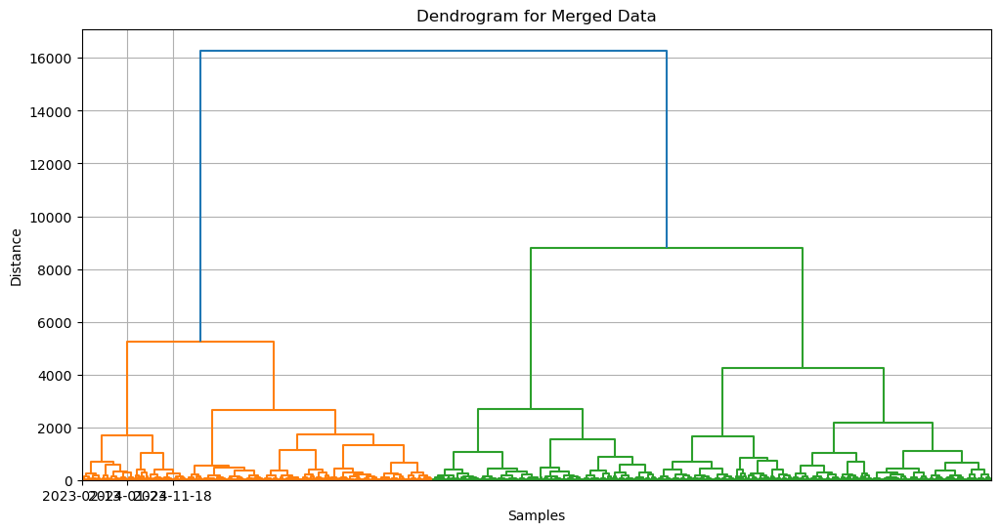

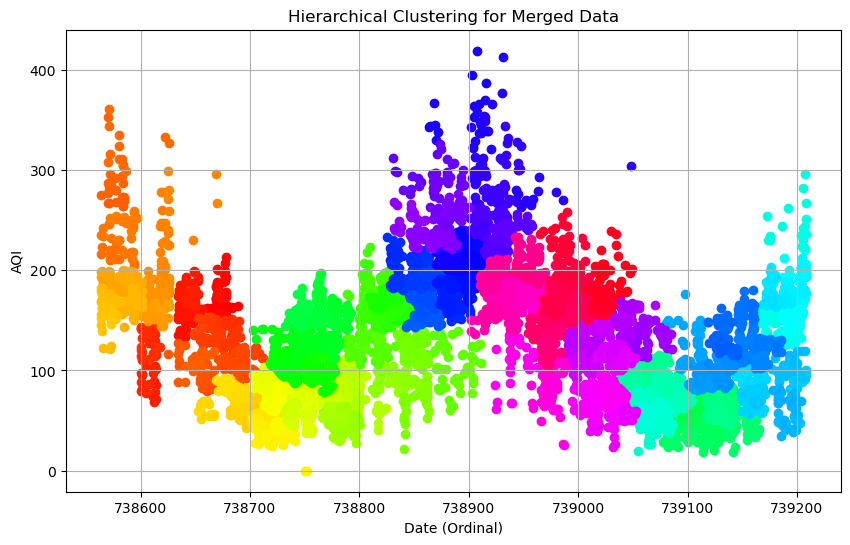

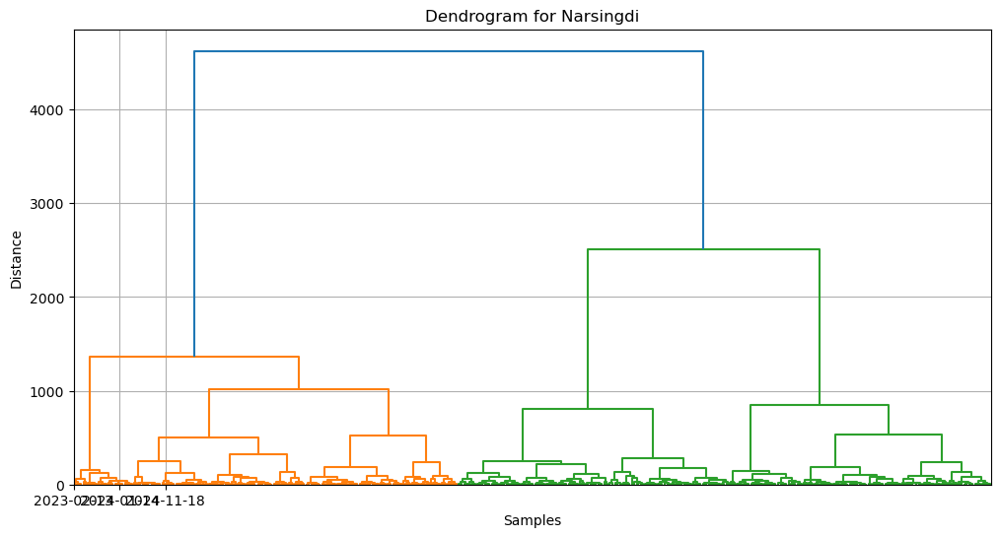

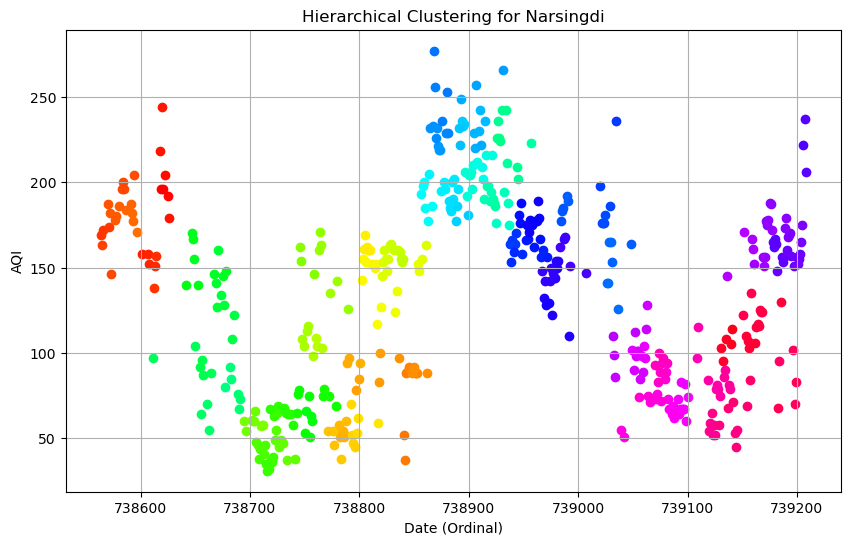

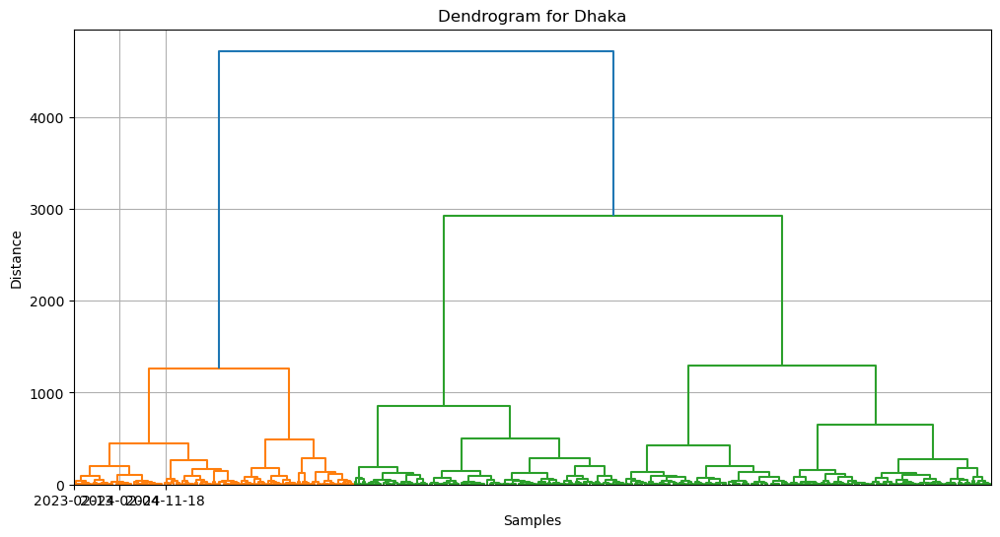

...

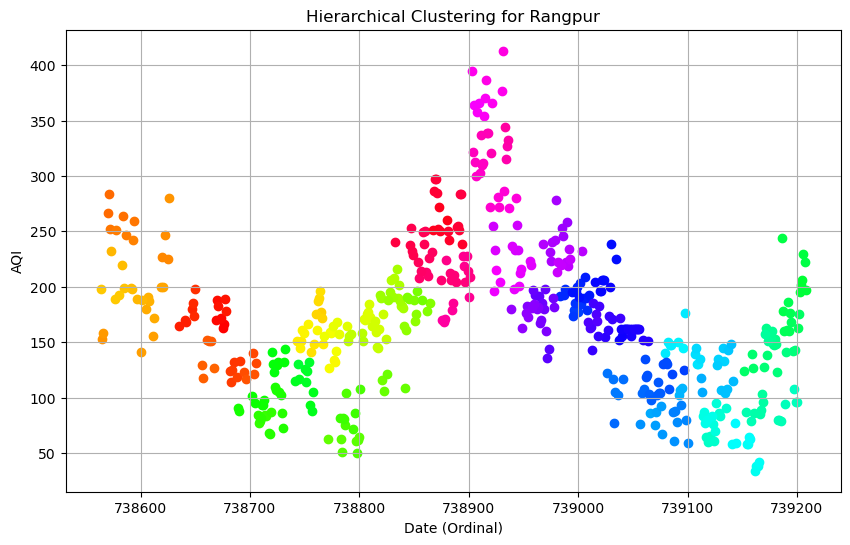

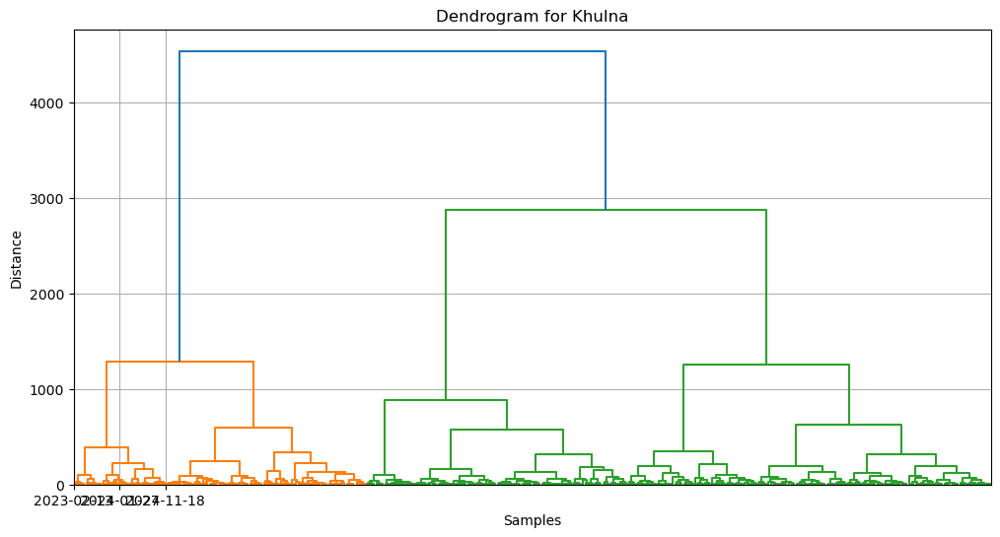

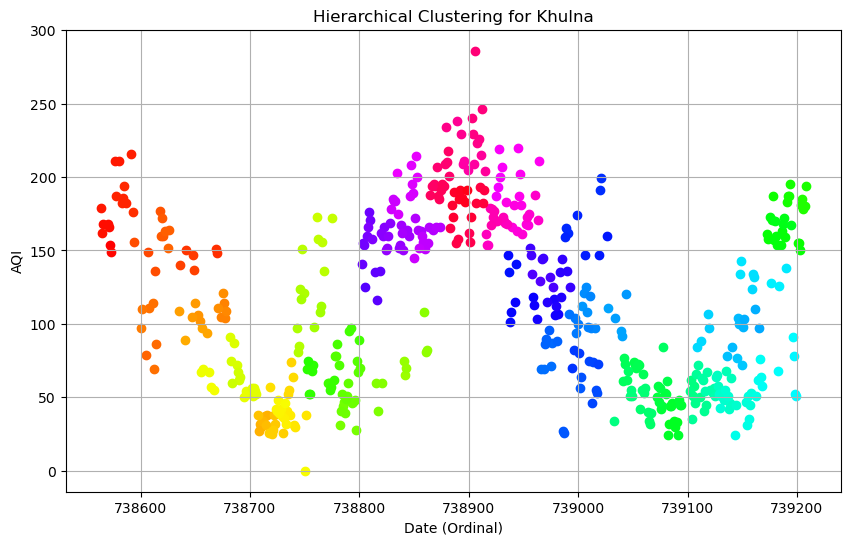

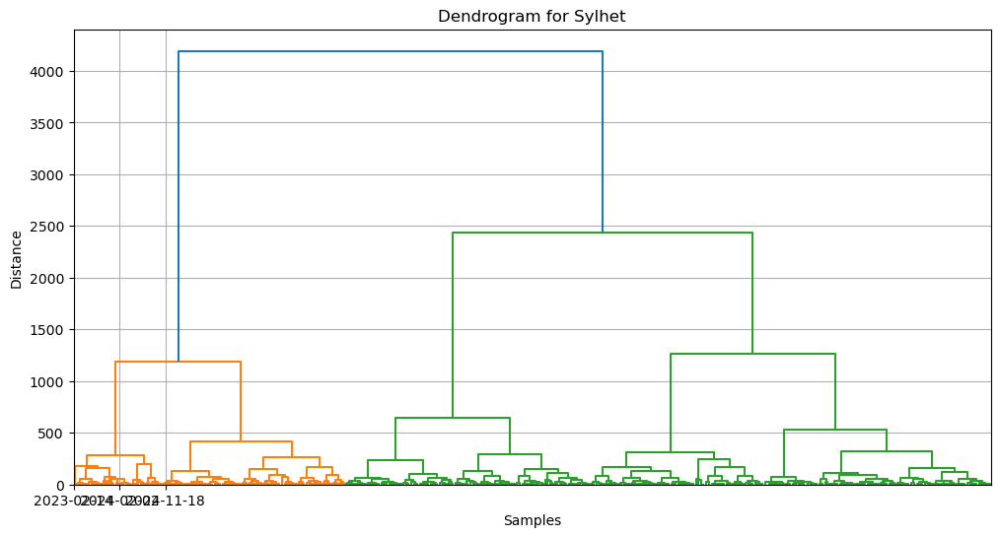

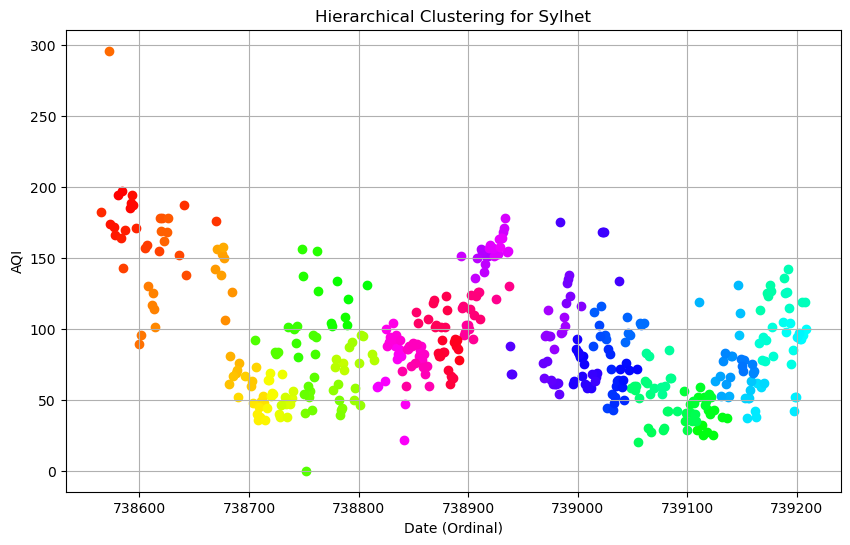

In [55]:
#Clustering Analysis: Apply hierarchical clustering to group cities based on AQI patterns or pollutant dominance.


# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Load the data (replace 'your_data.csv' with the path to your dataset)
# df = pd.read_csv('your_data.csv')

# Filter necessary columns (Date, City, AQI)
df = df[['Date', 'City', 'AQI', 'Responsible Pollutant']].dropna()

# Convert Date to numerical format for clustering purposes (ordinal encoding)
df['Date_Ordinal'] = pd.to_datetime(df['Date']).map(pd.Timestamp.toordinal)

# Function to apply hierarchical clustering and visualize dendrogram
def hierarchical_clustering(data, title, x_col, y_col, method='ward', threshold=5):
    # Prepare data for clustering
    clustering_data = data[[x_col, y_col]].values

    # Apply hierarchical clustering
    linked = linkage(clustering_data, method=method)

    # Plot dendrogram
    plt.figure(figsize=(12, 6))
    dendro = dendrogram(linked, orientation='top', distance_sort='ascending', show_leaf_counts=True, no_labels=True)
    plt.title(f"Dendrogram for {title}")
    plt.xlabel('Samples')
    plt.ylabel('Distance')
    
    # Update x-axis ticks: first, middle, and last date
    xticks = [0, len(data) // 2, len(data) - 1]
    xtick_dates = [data.iloc[i][x_col] for i in xticks]
    xtick_labels = [
        pd.Timestamp.fromordinal(int(xtick_dates[0])).strftime('%Y-%m-%d'),
        pd.Timestamp.fromordinal(int(xtick_dates[1])).strftime('%Y-%m-%d'),
        pd.Timestamp.fromordinal(int(xtick_dates[2])).strftime('%Y-%m-%d'),
    ]
    plt.xticks(ticks=xticks, labels=xtick_labels)
    plt.grid()
    plt.show()

    # Apply flat clustering to group into clusters
    clusters = fcluster(linked, threshold, criterion='distance')
    data['Cluster'] = clusters

    return data, clusters

# Hierarchical Clustering for Merged Data
merged_data = df[['Date_Ordinal', 'AQI']].copy()
merged_data, merged_clusters = hierarchical_clustering(merged_data, title="Merged Data", x_col='Date_Ordinal', y_col='AQI')

# Visualize the clusters for merged data
plt.figure(figsize=(10, 6))
colors = sns.color_palette('hsv', len(set(merged_clusters)))
for cluster_id in np.unique(merged_clusters):
    cluster_data = merged_data[merged_data['Cluster'] == cluster_id]
    plt.scatter(cluster_data['Date_Ordinal'], cluster_data['AQI'], color=colors[cluster_id - 1])
plt.title('Hierarchical Clustering for Merged Data')
plt.xlabel('Date (Ordinal)')
plt.ylabel('AQI')
plt.grid()
plt.show()

# Hierarchical Clustering for Individual Cities
for city in df['City'].unique():
    city_data = df[df['City'] == city][['Date_Ordinal', 'AQI']].copy()
    city_data, city_clusters = hierarchical_clustering(city_data, title=f"{city}", x_col='Date_Ordinal', y_col='AQI')

    # Visualize the clusters for each city
    plt.figure(figsize=(10, 6))
    colors = sns.color_palette('hsv', len(set(city_clusters)))
    for cluster_id in np.unique(city_clusters):
        cluster_data = city_data[city_data['Cluster'] == cluster_id]
        plt.scatter(cluster_data['Date_Ordinal'], cluster_data['AQI'], color=colors[cluster_id - 1])
    plt.title(f'Hierarchical Clustering for {city}')
    plt.xlabel('Date (Ordinal)')
    plt.ylabel('AQI')
    plt.grid()
    plt.show()


STL decomposition, I need to study before givinmg an analysis to ya'll

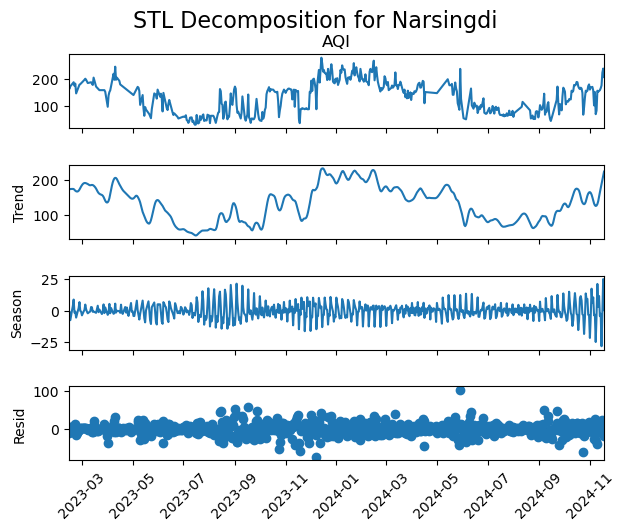

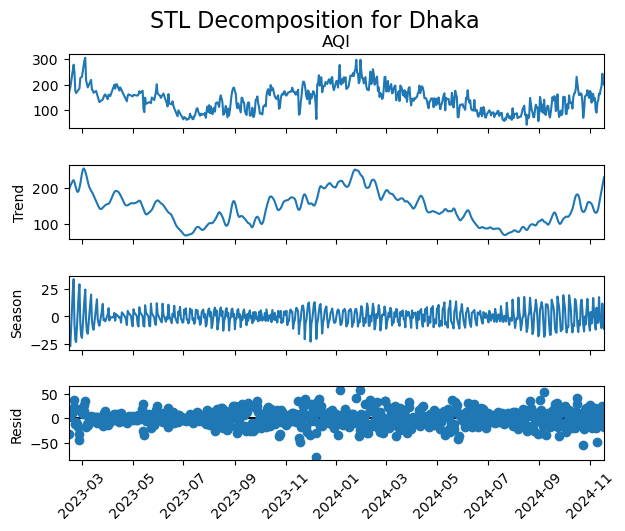

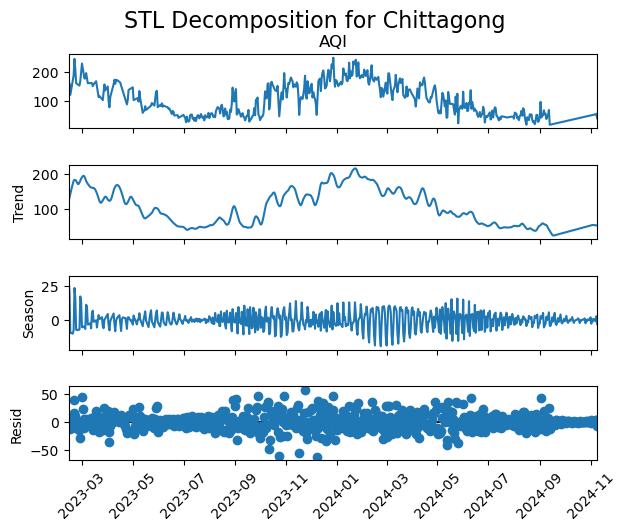

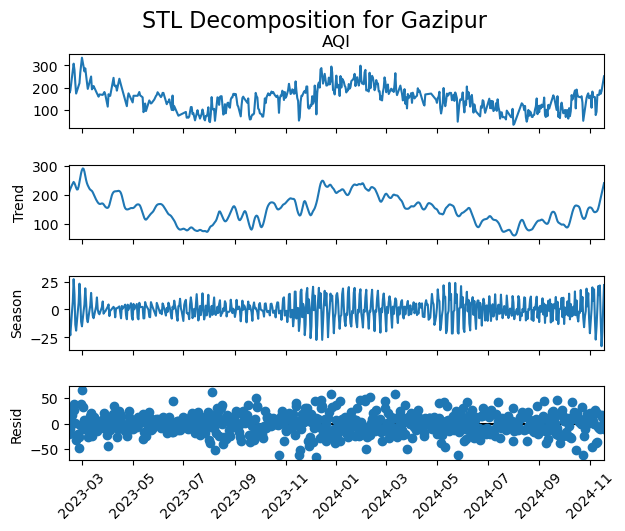

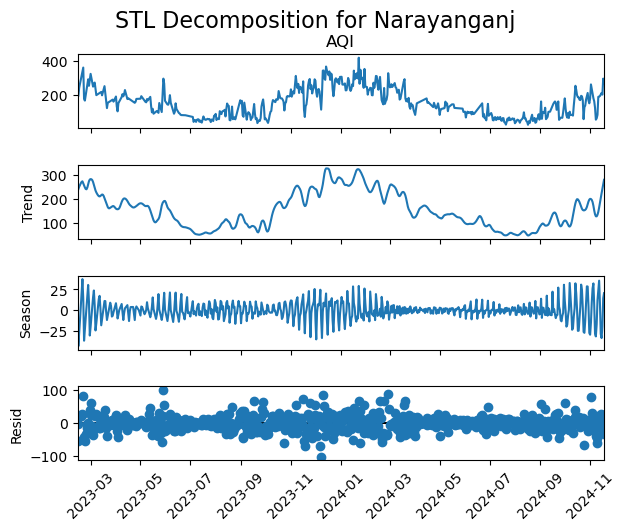

...

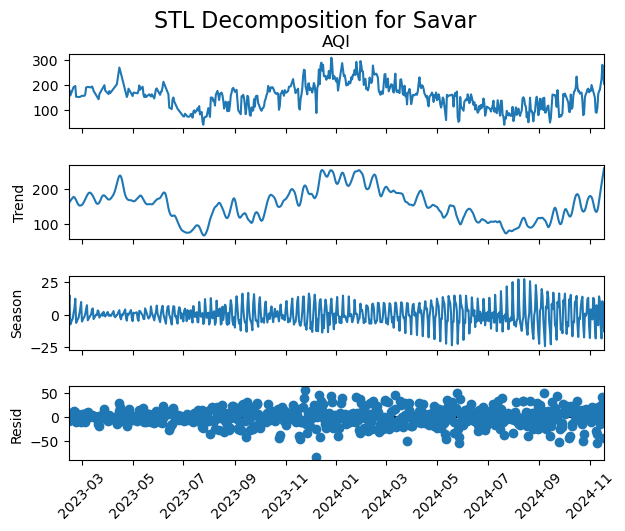

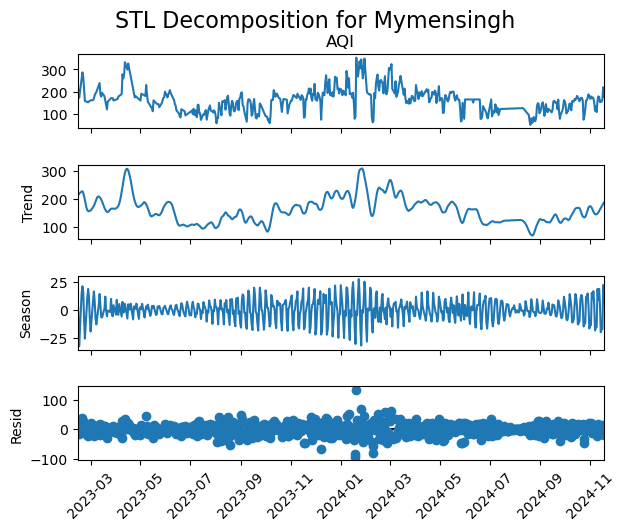

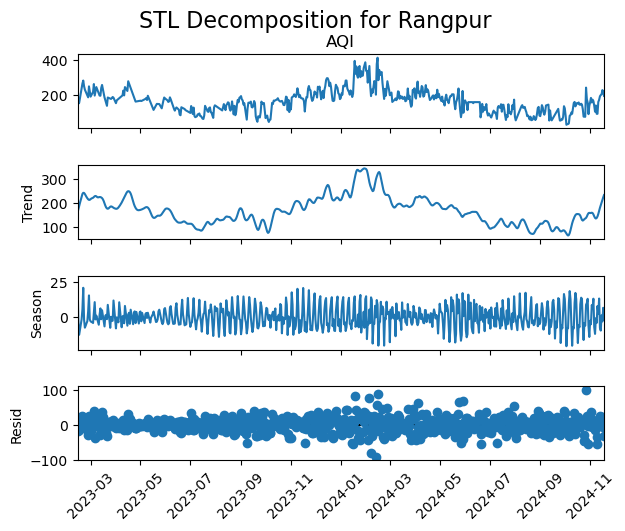

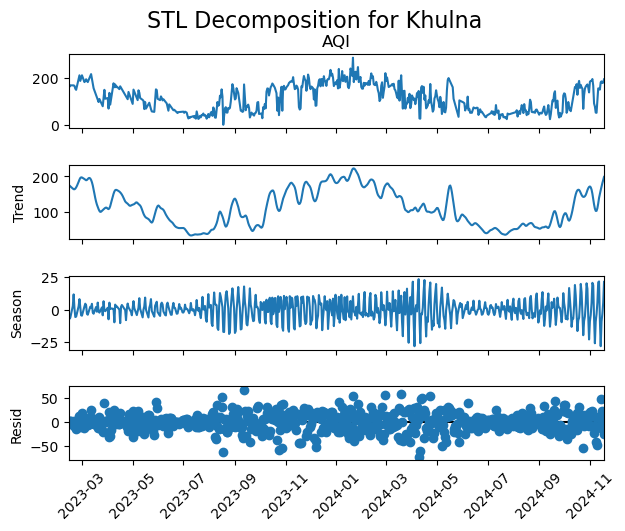

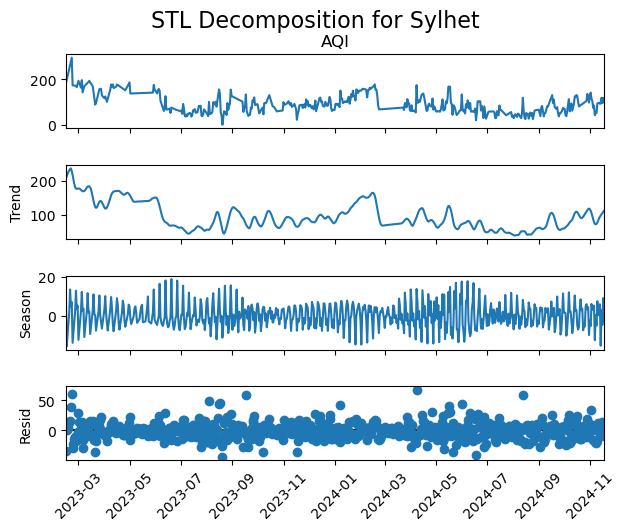

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import STL

# Loop through all 13 cities
for city in df['City'].unique():
    try:
        city_data = df[df['City'] == city].copy()
        city_data['Date'] = pd.to_datetime(city_data['Date'])
        
        # Ensure unique dates by aggregating (e.g., taking mean AQI per date)
        city_data = city_data.groupby('Date').mean(numeric_only=True)
        
        # Ensure AQI is sorted and fill any gaps
        city_data = city_data['AQI'].asfreq('D').interpolate()
        
        # STL Decomposition
        stl = STL(city_data, seasonal=13)  # Adjust 'seasonal' as per periodicity
        result = stl.fit()
        
        # Plot Decomposition
        fig = result.plot()
        
        # Adjust spacing for better visualization
        fig.subplots_adjust(hspace=0.5)  # Increase vertical spacing
        plt.suptitle(f"STL Decomposition for {city}", fontsize=16, y=1.02)  # Adjust title position
        
        # Rotate x-axis dates
        for ax in fig.axes:
            ax.tick_params(axis='x', rotation=45)  # Rotate x-axis labels
        
        plt.show()
    except Exception as e:
        print(f"An error occurred for {city}: {e}")
